In [1]:
import torch
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import scipy.io as scio
import os
from HS_reading import *

from sklearn.decomposition import NMF
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression


import warnings
warnings.filterwarnings("ignore")

onset_time = {"HS44":0,"HS45":0,"HS47":0,"HS48":0,"HS50":0,"HS54":0,"HS71":0,"HS73":0,"HS76":0}
fs = 10
ds_a = -30
ds_p = 30
delays = np.arange(ds_a, ds_p)

/Users/zhaozehao/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:35: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps=np.finfo(np.float).eps,
/Users/zhaozehao/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:597: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps=np.finfo(np.float).eps, c

In [2]:
feature_pool = {}
ex_features = {}
feature_pool["phonetic_model"] = ['bilabial', 'secondary labial', 'alveolar', 'velar', 
               'mandibular', 'voiced', 'oral stop', 'fricative', 
               'back tongue', 'high tongue', 'lip rounding', 
               'jaw open']
ex_features["phonetic_model"] = ['bilabial', 'secondary labial', 'alveolar', 'velar', 
               'mandibular', 'voiced', 'oral stop', 'fricative', 
               'back tongue', 'high tongue', 'lip rounding', 
               'jaw open']

# feature_pool["at_model"] = ["relPitch","lower_incisor","tongue","lip"]
# ex_features["at_model"] = ["relPitch","lower_incisor","tongue","lip"]

feature_pool["trace_model"] = ["relPitch","lower_incisor","upper_lip","lower_lip","tongue_tip","tongue_body","tongue_dorsum"]
ex_features["trace_model"] = ["relPitch","lower_incisor","upper_lip","lower_lip","tongue_tip","tongue_body","tongue_dorsum"]

feature_pool["audio_model"] = ['syllable', 'intensity', 'absPitch', 'f1', 'f2', 'peakRate']
ex_features["audio_model"] = ['syllable', 'intensity', 'absPitch', 'f1', 'f2', 'peakRate']

feature_pool["phonetic_model_2"] = ['consonantal_place', 'consonantal_manner', 'vowel_place']
ex_features["phonetic_model_2"] = ['consonantal_place', 'consonantal_manner', 'vowel_place']

44
45
47
48
50
54
71
73
76
78


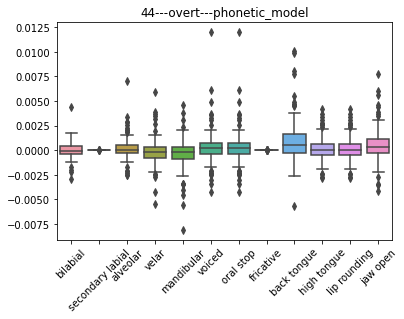

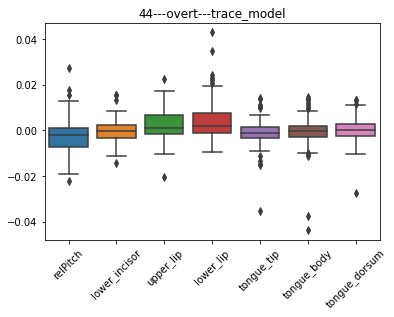

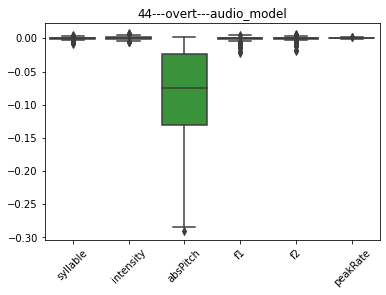

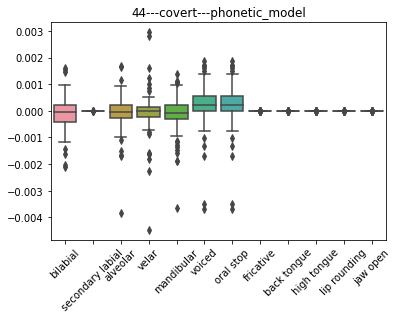

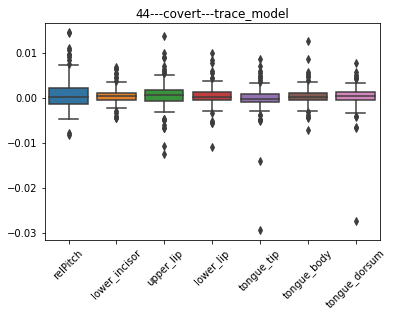

...

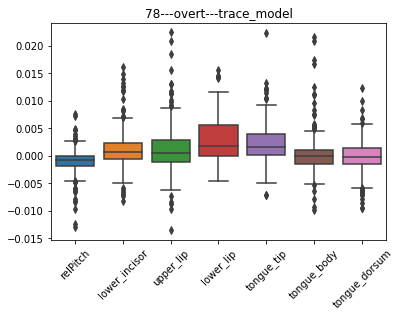

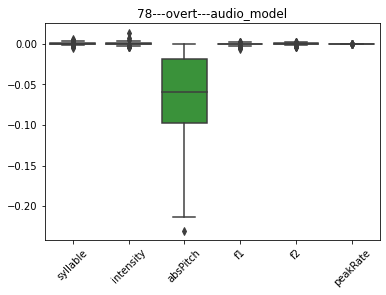

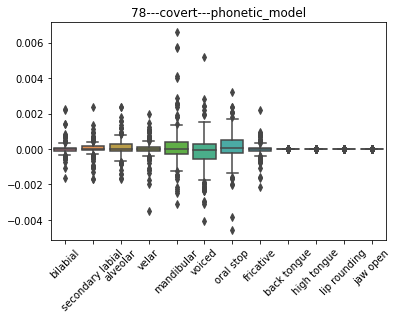

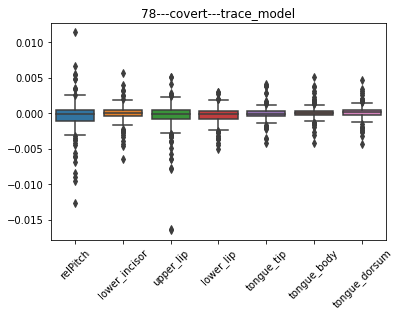

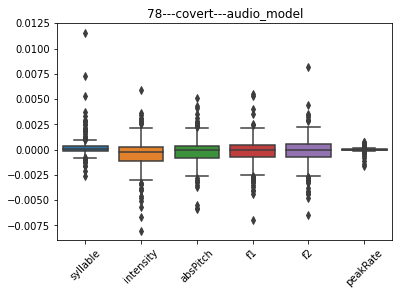

In [3]:
HS_list = [44,45,47,48,50,54,71,73,76,78]
task_list = ["overt", "covert"]
model_list = ["phonetic_model", "trace_model", "audio_model"]

for HS in HS_list:
    print(HS)
    save_path = clean_data_path + "TRF/"+"HS"+str(HS)+"/"
    for task_name in task_list:
        for model in model_list:
            r2_channel = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model+"_r2_channel.npy", allow_pickle=True).item()
            del_r2_channel = {}
            for i in ex_features[model]:
                del_r2_channel[i] = r2_channel["all"]-r2_channel["ex_"+i]
#             plt.figure(figsize=(30,10))
            plt.figure()
            ax = sns.boxplot(data=pd.DataFrame(del_r2_channel))
            ax.set_xticklabels(del_r2_channel.keys(),rotation=45)
            ax.set_title(str(HS)+"---"+task_name+"---"+model)

44
45
47
48
50
54
71
73
76
78


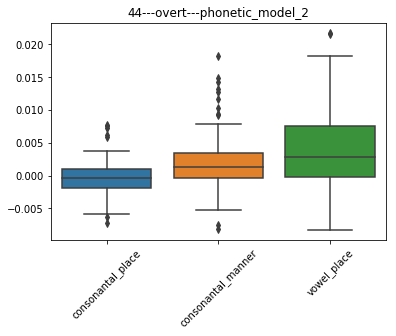

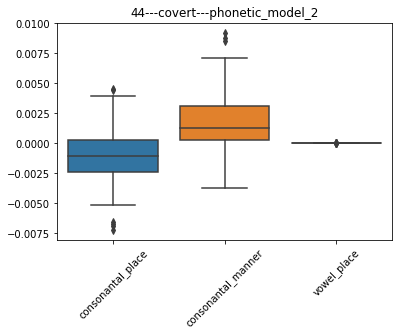

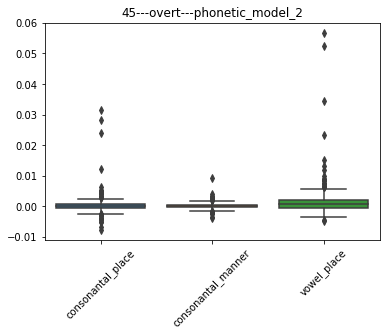

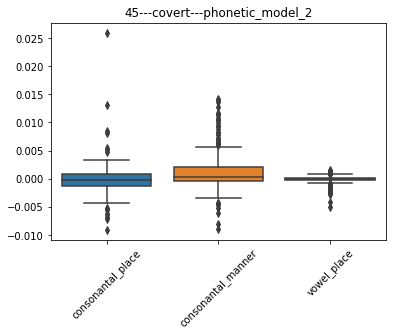

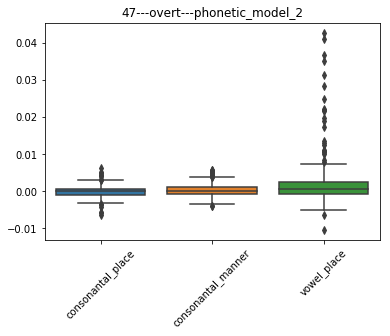

...

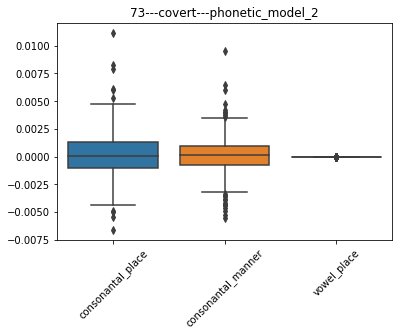

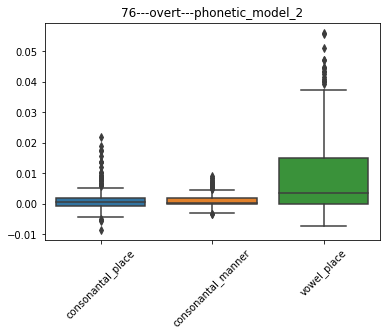

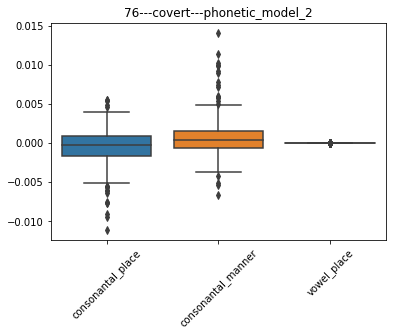

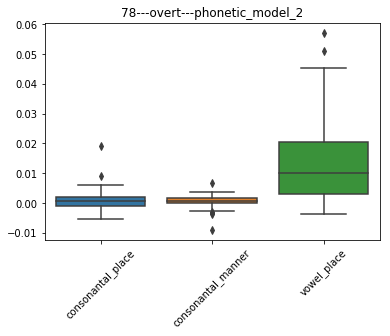

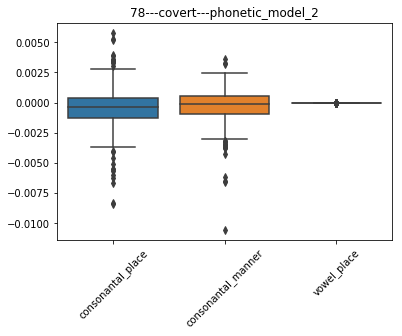

In [9]:
HS_list = [44,45,47,48,50,54,71,73,76,78]
task_list = ["overt", "covert"]
model_list = ["phonetic_model_2"]

for HS in HS_list:
    print(HS)
    save_path = clean_data_path + "TRF/"+"HS"+str(HS)+"/"
    for task_name in task_list:
        for model in model_list:
            r2_channel = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model+"_r2_channel.npy", allow_pickle=True).item()
            del_r2_channel = {}
            for i in ex_features[model]:
                del_r2_channel[i] = r2_channel["all"]-r2_channel["ex_"+i]
#             plt.figure(figsize=(30,10))
            plt.figure()
            ax = sns.boxplot(data=pd.DataFrame(del_r2_channel))
            ax.set_xticklabels(del_r2_channel.keys(),rotation=45)
            ax.set_title(str(HS)+"---"+task_name+"---"+model)

44
45
47
48
50
54
71
73
76
78


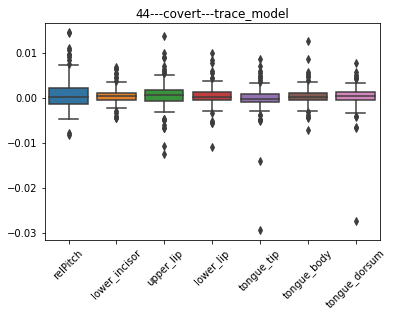

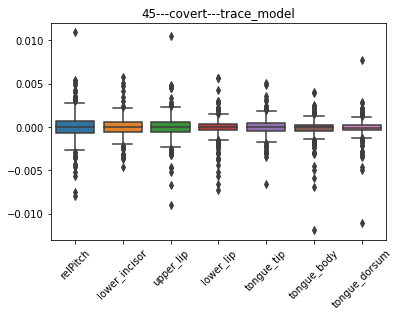

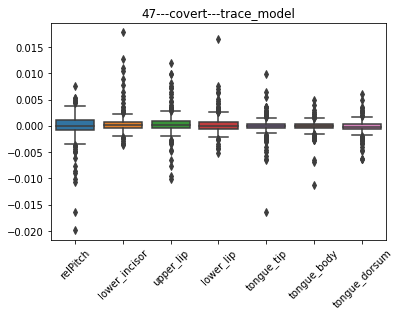

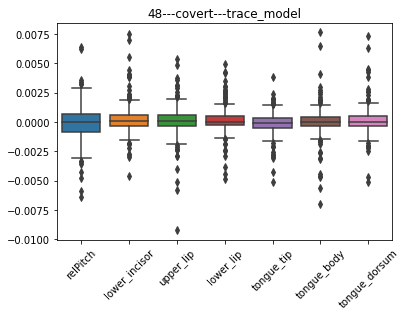

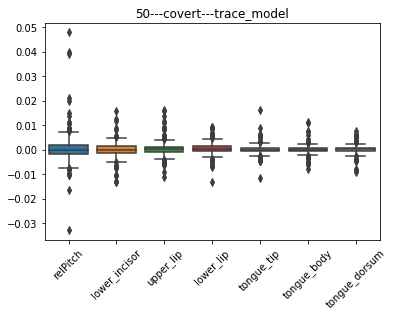

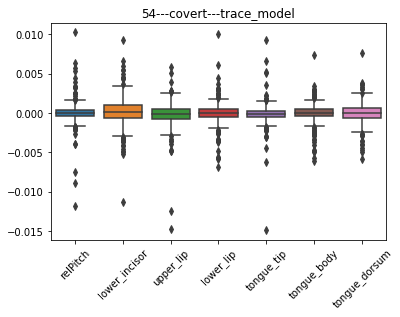

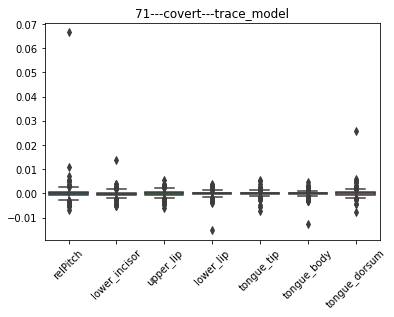

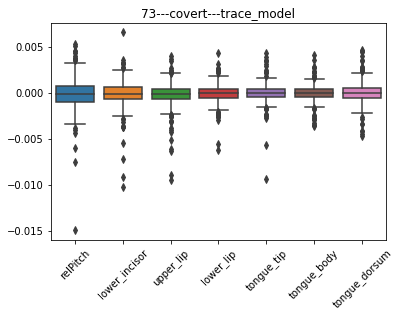

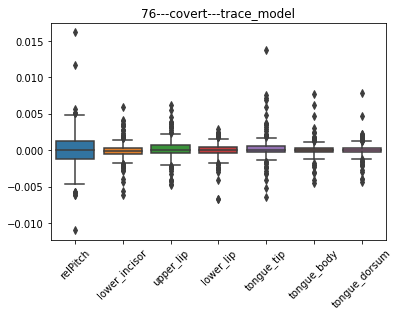

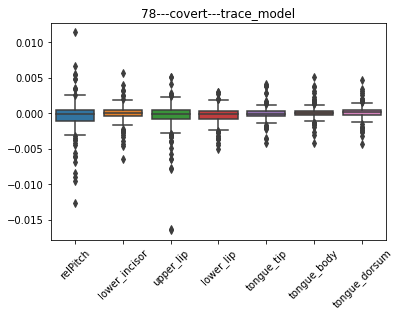

In [122]:
HS_list = [44,45,47,48,50,54,71,73,76,78]
task_list = ["covert"]
model_list = ["trace_model"]

for HS in HS_list:
    print(HS)
    save_path = clean_data_path + "TRF/"+"HS"+str(HS)+"/"
    for task_name in task_list:
        for model in model_list:
            r2_channel = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model+"_r2_channel.npy", allow_pickle=True).item()
            del_r2_channel = {}
            for i in ex_features[model]:
                del_r2_channel[i] = r2_channel["all"]-r2_channel["ex_"+i]
#             plt.figure(figsize=(30,10))
            plt.figure()
            ax = sns.boxplot(data=pd.DataFrame(del_r2_channel))
            ax.set_xticklabels(del_r2_channel.keys(),rotation=45)
            ax.set_title(str(HS)+"---"+task_name+"---"+model)

In [124]:
del_r2_channel['relPitch'].shape

(256,)

44
45
47
48
50
54
71
73
76
78


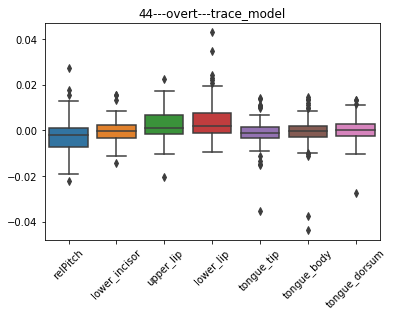

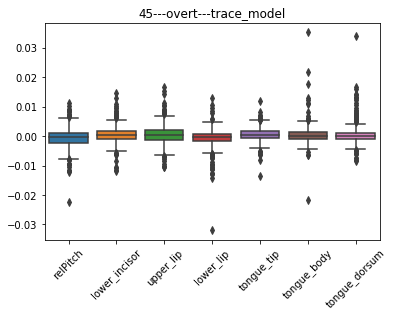

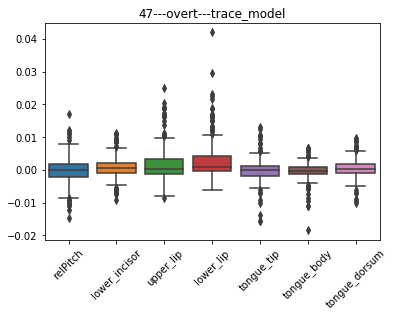

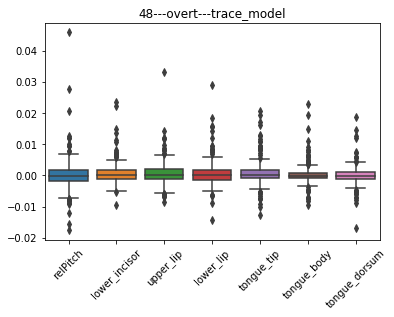

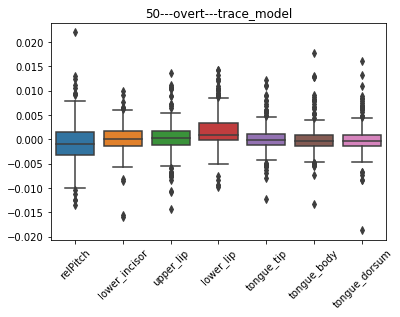

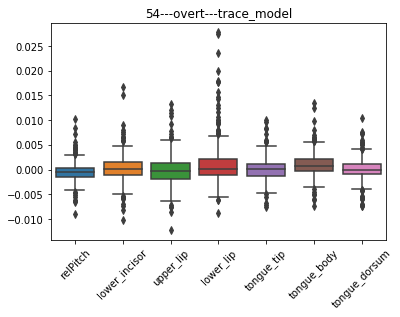

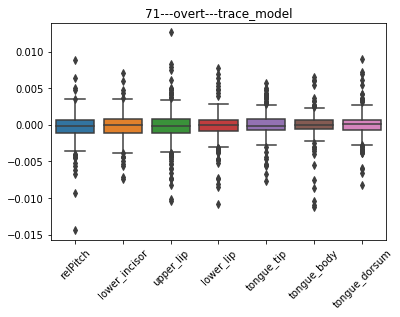

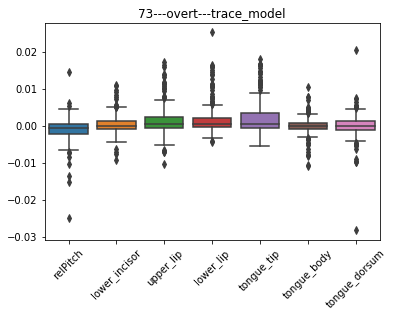

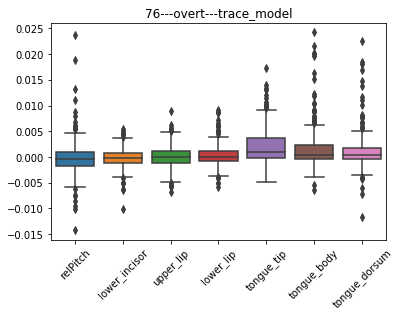

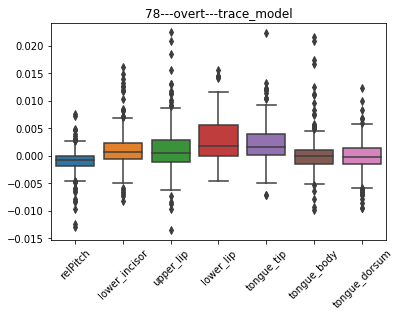

In [9]:
HS_list = [44,45,47,48,50,54,71,73,76,78]
task_list = ["overt"]
model_list = ["trace_model"]

for HS in HS_list:
    print(HS)
    save_path = clean_data_path + "TRF/"+"HS"+str(HS)+"/"
    for task_name in task_list:
        for model in model_list:
            r2_channel = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model+"_r2_channel.npy", allow_pickle=True).item()
            del_r2_channel = {}
            for i in ex_features[model]:
                del_r2_channel[i] = r2_channel["all"]-r2_channel["ex_"+i]
#             plt.figure(figsize=(30,10))
            plt.figure()
            ax = sns.boxplot(data=pd.DataFrame(del_r2_channel))
            ax.set_xticklabels(del_r2_channel.keys(),rotation=45)
            ax.set_title(str(HS)+"---"+task_name+"---"+model)

In [10]:
all_model_list = ["phonetic_model","trace_model","audio_model"]

44


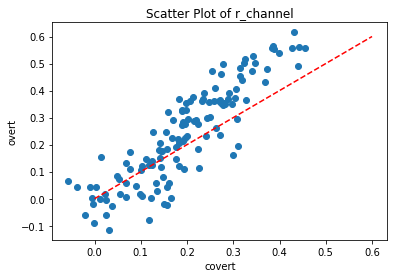

45


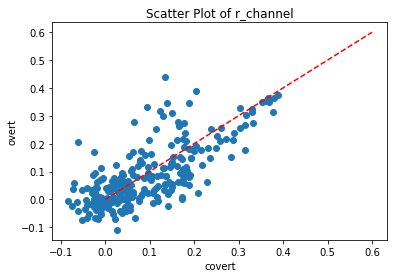

47


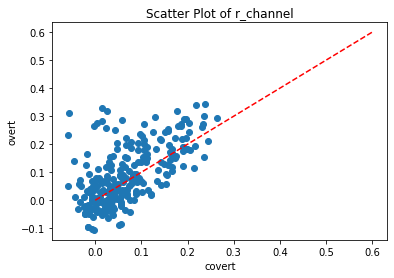

48


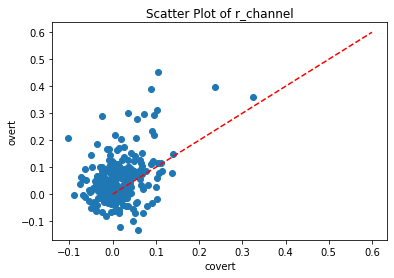

50


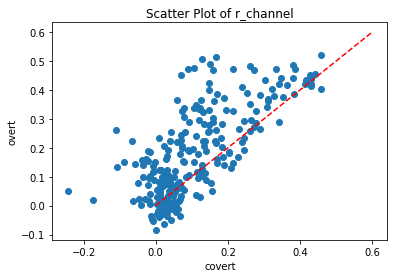

54


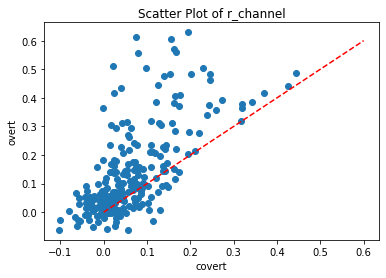

71


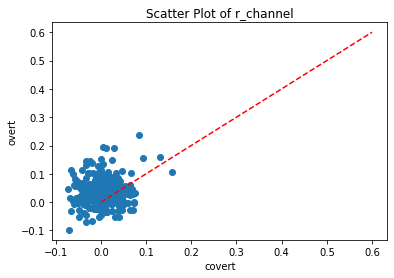

73


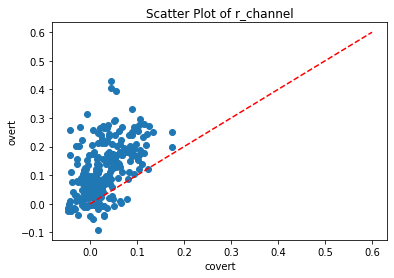

76


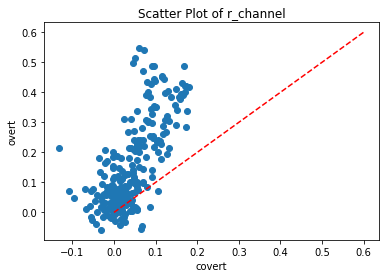

78


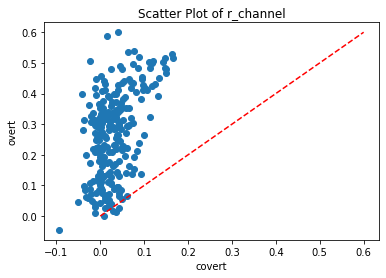

In [126]:
HS_list = [44,45,47,48,50,54,71,73,76,78]
task_name_x = "covert"
task_name_y = "overt"
model = "trace_model"

fs = 10
ds_a = -30
ds_p = 30
delays = np.arange(ds_a, ds_p)


for HS in HS_list:
    print(HS)
    save_path = clean_data_path + "TRF/"+"HS"+str(HS)+"/"
    r_channel_x = np.load(save_path+"HS"+str(HS)+"_"+task_name_x+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model+"_corr_channel.npy", allow_pickle=True).item()
    r_channel_y = np.load(save_path+"HS"+str(HS)+"_"+task_name_y+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model+"_corr_channel.npy", allow_pickle=True).item()

    x = r_channel_x["all"]
    y = r_channel_y["all"]

    # 绘制散点图
    plt.scatter(x, y)

    # 设置x和y轴的范围相同，使其对称
#     plt.gca().set_aspect('equal', adjustable='box')
    
    plt.plot([0, 0.6], [0, 0.6], color='red', linestyle='--')

#     # 设置x和y轴的范围为0到0.6
#     plt.xlim(0, 0.6)
#     plt.ylim(0, 0.6)
    
    # 添加标题和轴标签
    plt.title('Scatter Plot of r_channel')
    plt.xlabel(task_name_x)
    plt.ylabel(task_name_y)

    # 显示图形
    plt.show()

44


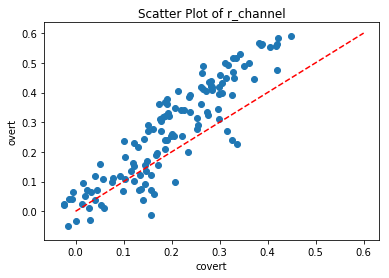

45


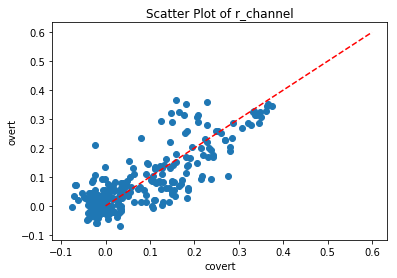

47


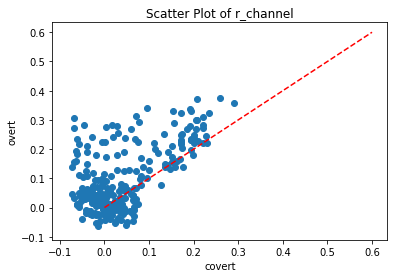

48


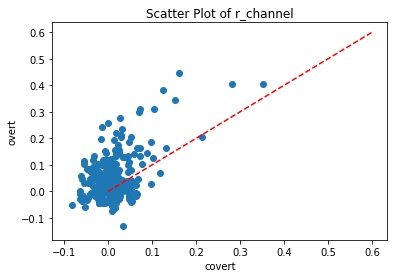

50


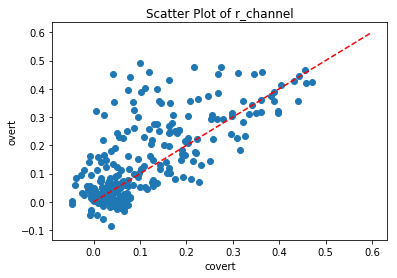

54


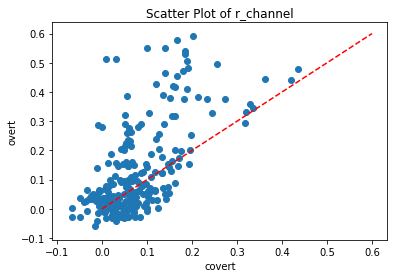

71


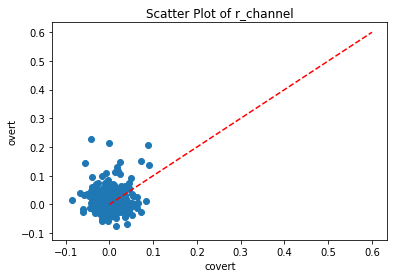

73


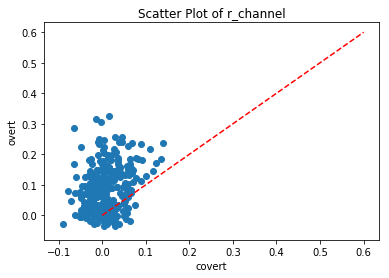

76


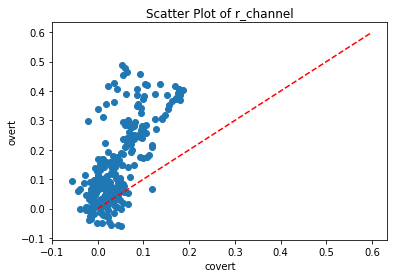

78


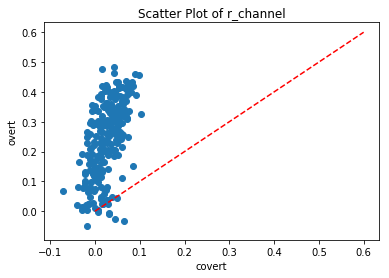

In [17]:
HS_list = [44,45,47,48,50,54,71,73,76,78]
task_name_x = "covert"
task_name_y = "overt"
model = "phonetic_model"

fs = 10
ds_a = -30
ds_p = 30
delays = np.arange(ds_a, ds_p)


for HS in HS_list:
    print(HS)
    save_path = clean_data_path + "TRF/"+"HS"+str(HS)+"/"
    r_channel_x = np.load(save_path+"HS"+str(HS)+"_"+task_name_x+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model+"_corr_channel.npy", allow_pickle=True).item()
    r_channel_y = np.load(save_path+"HS"+str(HS)+"_"+task_name_y+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model+"_corr_channel.npy", allow_pickle=True).item()

    x = r_channel_x["all"]
    y = r_channel_y["all"]

    # 绘制散点图
    plt.scatter(x, y)

    # 设置x和y轴的范围相同，使其对称
#     plt.gca().set_aspect('equal', adjustable='box')
    
    plt.plot([0, 0.6], [0, 0.6], color='red', linestyle='--')

#     # 设置x和y轴的范围为0到0.6
#     plt.xlim(0, 0.6)
#     plt.ylim(0, 0.6)
    
    # 添加标题和轴标签
    plt.title('Scatter Plot of r_channel')
    plt.xlabel(task_name_x)
    plt.ylabel(task_name_y)

    # 显示图形
    plt.show()

44


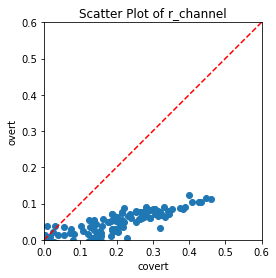

45


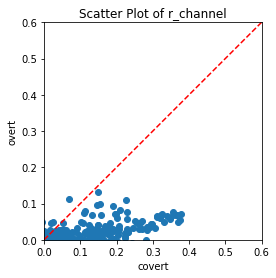

47


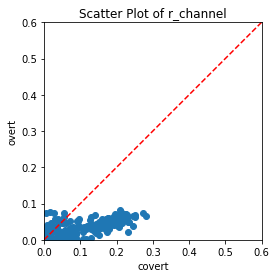

48


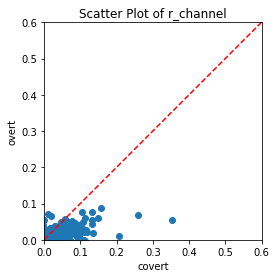

50


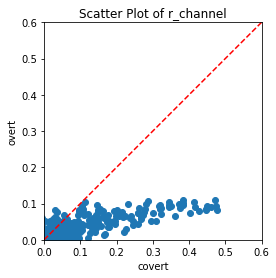

54


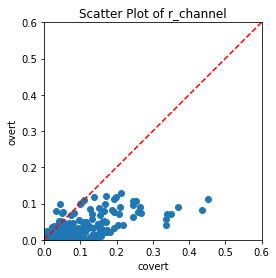

71


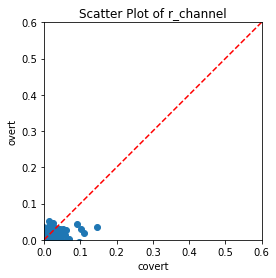

73


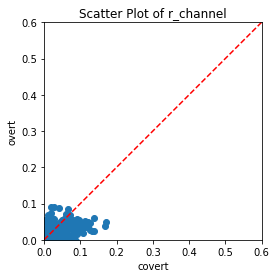

76


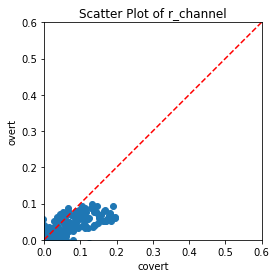

78


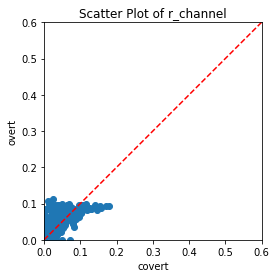

In [18]:
HS_list = [44,45,47,48,50,54,71,73,76,78]
task_name_x = "covert"
task_name_y = "overt"
model = "audio_model"

fs = 10
ds_a = -30
ds_p = 30
delays = np.arange(ds_a, ds_p)


for HS in HS_list:
    print(HS)
    save_path = clean_data_path + "TRF/"+"HS"+str(HS)+"/"
    r_channel_x = np.load(save_path+"HS"+str(HS)+"_"+task_name_x+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model+"_corr_channel.npy", allow_pickle=True).item()
    r_channel_y = np.load(save_path+"HS"+str(HS)+"_"+task_name_y+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model+"_corr_channel.npy", allow_pickle=True).item()

    x = r_channel_x["all"]
    y = r_channel_y["all"]

    # 绘制散点图
    plt.scatter(x, y)

    # 设置x和y轴的范围相同，使其对称
    plt.gca().set_aspect('equal', adjustable='box')
    
    plt.plot([0, 0.6], [0, 0.6], color='red', linestyle='--')

    # 设置x和y轴的范围为0到0.6
    plt.xlim(0, 0.6)
    plt.ylim(0, 0.6)
    
    # 添加标题和轴标签
    plt.title('Scatter Plot of r_channel')
    plt.xlabel(task_name_x)
    plt.ylabel(task_name_y)

    # 显示图形
    plt.show()

44


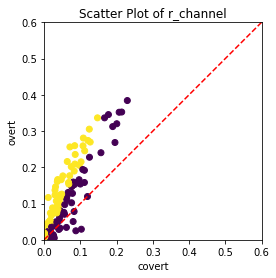

45


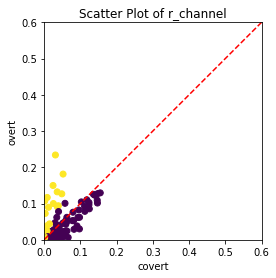

47


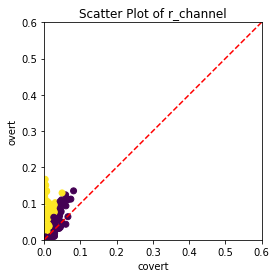

48


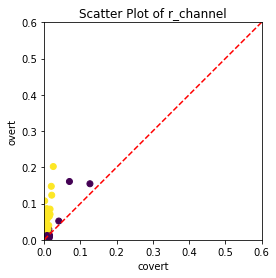

50


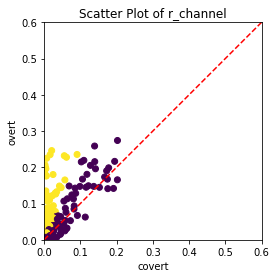

54


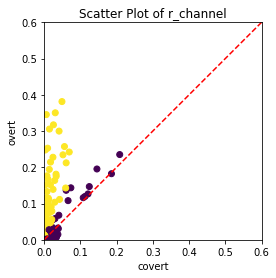

71


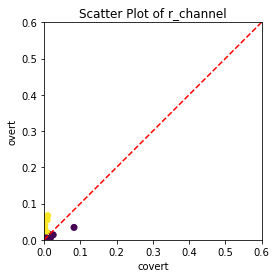

73


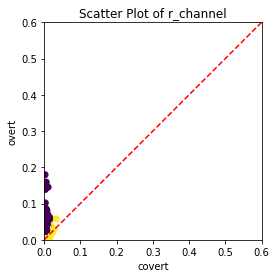

76


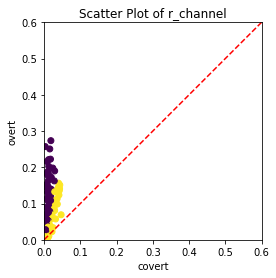

78


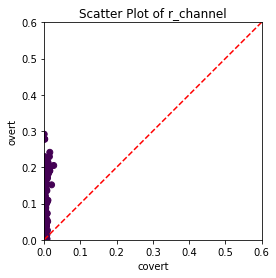

In [21]:
HS_list = [44,45,47,48,50,54,71,73,76,78]
task_name_x = "covert"
task_name_y = "overt"

fs = 10
ds_a = -30
ds_p = 30
delays = np.arange(ds_a, ds_p)


for HS in HS_list:
    print(HS)
    save_path = clean_data_path + "TRF/"+"HS"+str(HS)+"/"
    r_channel_x = np.load(save_path+"HS"+str(HS)+"_"+task_name_x+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_r2_channel.npy", allow_pickle=True).item()
    r_channel_y = np.load(save_path+"HS"+str(HS)+"_"+task_name_y+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_r2_channel.npy", allow_pickle=True).item()

    x = r_channel_x["mel"]
    y = r_channel_y["mel"]
    
    # 将r值数据转换成一个矩阵
    r_values_matrix = np.array([x, y]).T

    # 定义NMF模型
    nmf_model = NMF(n_components=2, random_state=0)

    # 对矩阵进行NMF分解
    W = nmf_model.fit_transform(r_values_matrix)
    H = nmf_model.components_

    # 获取分类结果
    labels = np.argmax(W, axis=1)
    
    # 绘制散点图
    plt.scatter(x, y, c=labels, cmap='viridis')

    # 设置x和y轴的范围相同，使其对称
    plt.gca().set_aspect('equal', adjustable='box')
    
    plt.plot([0, 0.6], [0, 0.6], color='red', linestyle='--')

    # 设置x和y轴的范围为0到0.6
    plt.xlim(0, 0.6)
    plt.ylim(0, 0.6)
    
    # 添加标题和轴标签
    plt.title('Scatter Plot of r_channel')
    plt.xlabel(task_name_x)
    plt.ylabel(task_name_y)

    # 显示图形
    plt.show()

44


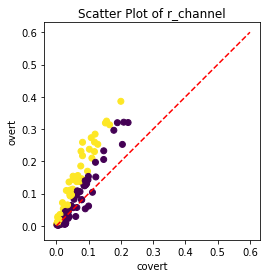

45


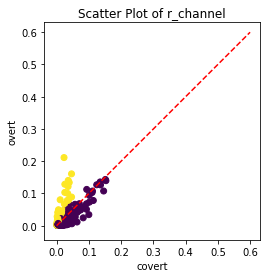

47


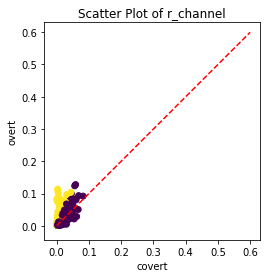

48


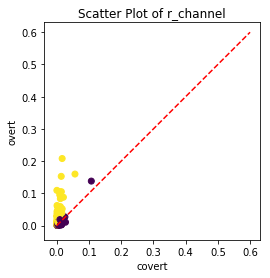

50


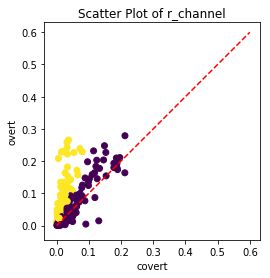

54


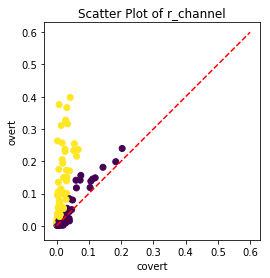

71


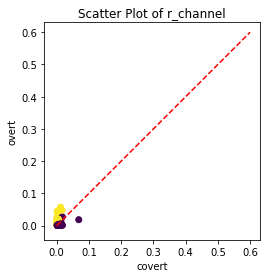

73


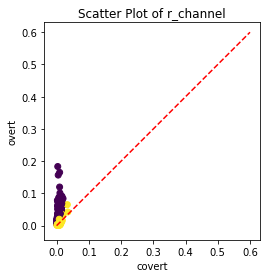

76


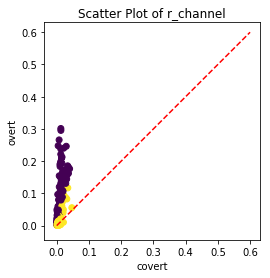

78


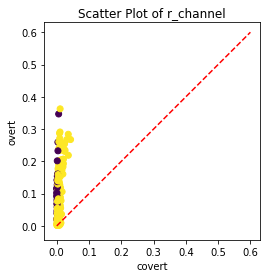

In [23]:
HS_list = [44,45,47,48,50,54,71,73,76,78]
task_name_x = "covert"
task_name_y = "overt"

fs = 10
ds_a = -30
ds_p = 30
delays = np.arange(ds_a, ds_p)


for HS in HS_list:
    print(HS)
    save_path = clean_data_path + "TRF/"+"HS"+str(HS)+"/"
    r_channel_x = np.load(save_path+"HS"+str(HS)+"_"+task_name_x+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_r2_channel.npy", allow_pickle=True).item()
    r_channel_y = np.load(save_path+"HS"+str(HS)+"_"+task_name_y+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_r2_channel.npy", allow_pickle=True).item()

    x = r_channel_x["trace"]
    y = r_channel_y["trace"]
    
    # 将r值数据转换成一个矩阵
    r_values_matrix = np.array([x, y]).T

    # 定义NMF模型
    nmf_model = NMF(n_components=2, random_state=0)

    # 对矩阵进行NMF分解
    W = nmf_model.fit_transform(r_values_matrix)
    H = nmf_model.components_

    # 获取分类结果
    labels = np.argmax(W, axis=1)
    
    # 绘制散点图
    plt.scatter(x, y, c=labels, cmap='viridis')

    # 设置x和y轴的范围相同，使其对称
    plt.gca().set_aspect('equal', adjustable='box')
    
    plt.plot([0, 0.6], [0, 0.6], color='red', linestyle='--')

#     # 设置x和y轴的范围为0到0.6
#     plt.xlim(0, 0.6)
#     plt.ylim(0, 0.6)
    
    # 添加标题和轴标签
    plt.title('Scatter Plot of r_channel')
    plt.xlabel(task_name_x)
    plt.ylabel(task_name_y)

    # 显示图形
    plt.show()

In [125]:
x.shape

(256,)

44


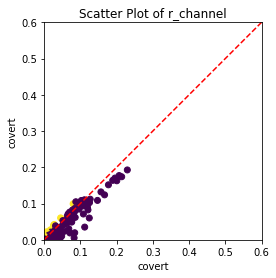

45


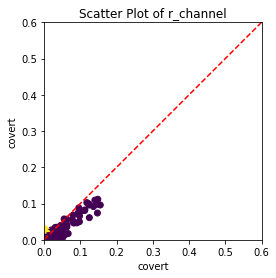

47


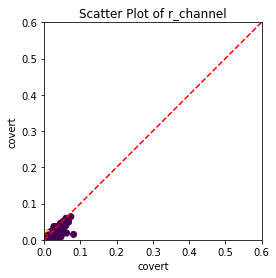

48


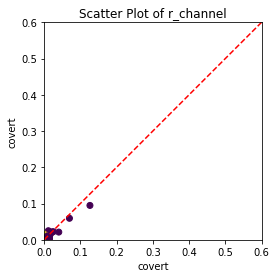

50


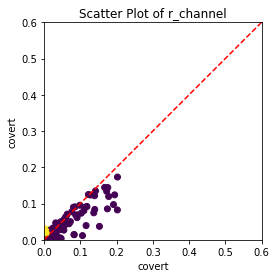

54


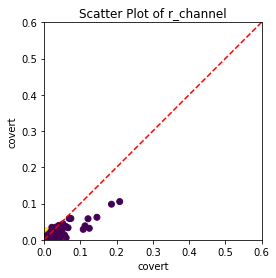

71


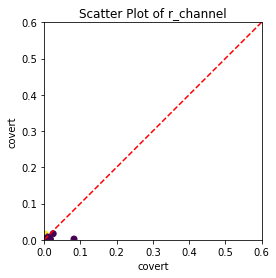

73


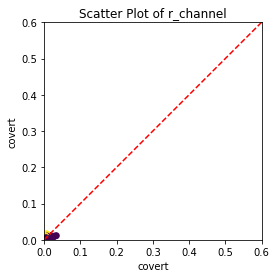

76


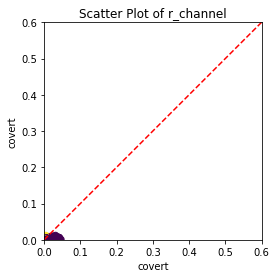

78


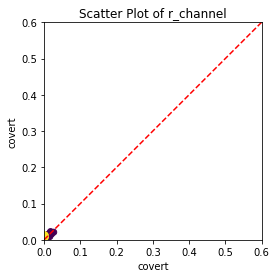

In [24]:
HS_list = [44,45,47,48,50,54,71,73,76,78]
task_name_x = "covert"
task_name_y = "covert"

fs = 10
ds_a = -30
ds_p = 30
delays = np.arange(ds_a, ds_p)


for HS in HS_list:
    print(HS)
    save_path = clean_data_path + "TRF/"+"HS"+str(HS)+"/"
    r_channel_x = np.load(save_path+"HS"+str(HS)+"_"+task_name_x+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_r2_channel.npy", allow_pickle=True).item()
    r_channel_y = np.load(save_path+"HS"+str(HS)+"_"+task_name_y+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_r2_channel.npy", allow_pickle=True).item()

    x = r_channel_x["mel"]
    y = r_channel_y["syllable"]
    
    # 将r值数据转换成一个矩阵
    r_values_matrix = np.array([x, y]).T

    # 定义NMF模型
    nmf_model = NMF(n_components=2, random_state=0)

    # 对矩阵进行NMF分解
    W = nmf_model.fit_transform(r_values_matrix)
    H = nmf_model.components_

    # 获取分类结果
    labels = np.argmax(W, axis=1)
    
    # 绘制散点图
    plt.scatter(x, y, c=labels, cmap='viridis')

    # 设置x和y轴的范围相同，使其对称
    plt.gca().set_aspect('equal', adjustable='box')
    
    plt.plot([0, 0.6], [0, 0.6], color='red', linestyle='--')

    # 设置x和y轴的范围为0到0.6
    plt.xlim(0, 0.6)
    plt.ylim(0, 0.6)
    
    # 添加标题和轴标签
    plt.title('Scatter Plot of r_channel')
    plt.xlabel(task_name_x)
    plt.ylabel(task_name_y)

    # 显示图形
    plt.show()

44


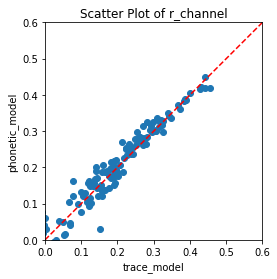

45


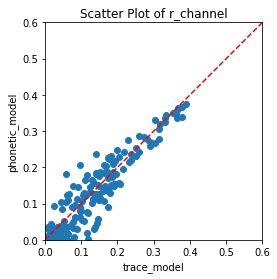

47


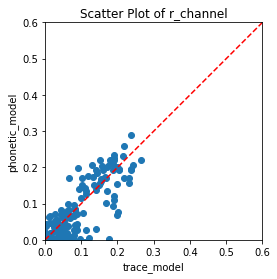

48


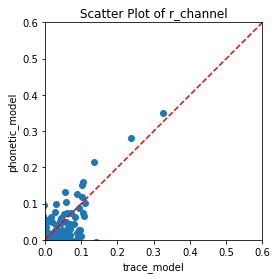

50


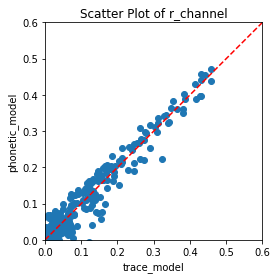

54


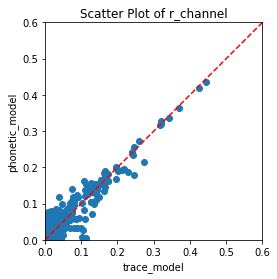

71


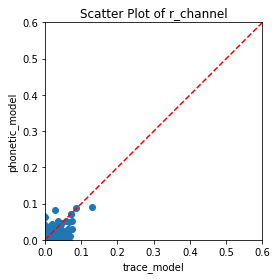

73


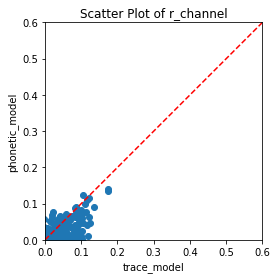

76


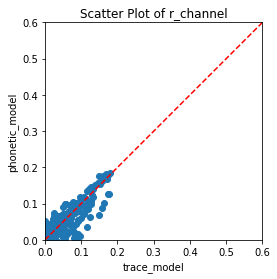

78


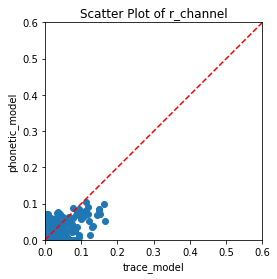

In [25]:
task_name = "covert"
model_x = "trace_model"
model_y = "phonetic_model"
fs = 10
ds_a = -30
ds_p = 30
delays = np.arange(ds_a, ds_p)


for HS in HS_list:
    print(HS)
    save_path = clean_data_path + "TRF/"+"HS"+str(HS)+"/"
    r_channel_x = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model_x+"_corr_channel.npy", allow_pickle=True).item()
    r_channel_y = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model_y+"_corr_channel.npy", allow_pickle=True).item()

    x = r_channel_x["all"]
    y = r_channel_y["all"]

    # 绘制散点图
    plt.scatter(x, y)

    # 设置x和y轴的范围相同，使其对称
    plt.gca().set_aspect('equal', adjustable='box')
    
    plt.plot([0, 0.6], [0, 0.6], color='red', linestyle='--')

    # 设置x和y轴的范围为0到0.6
    plt.xlim(0, 0.6)
    plt.ylim(0, 0.6)
    
    # 添加标题和轴标签
    plt.title('Scatter Plot of r_channel')
    plt.xlabel(model_x)
    plt.ylabel(model_y)

    # 显示图形
    plt.show()

44


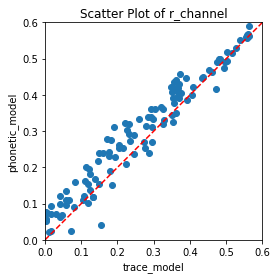

45


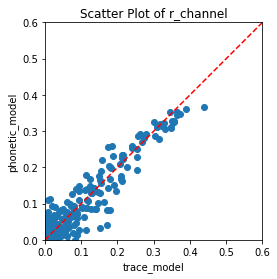

47


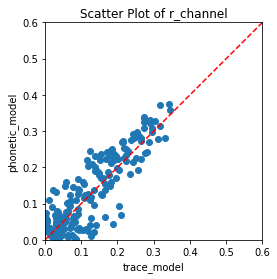

48


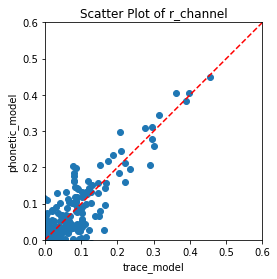

50


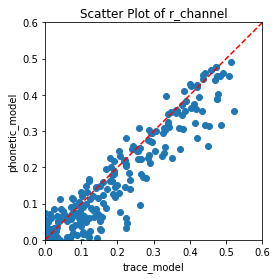

54


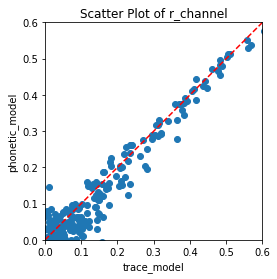

71


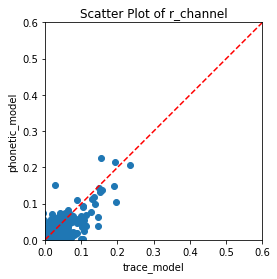

73


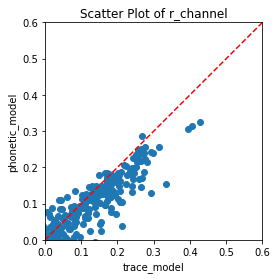

76


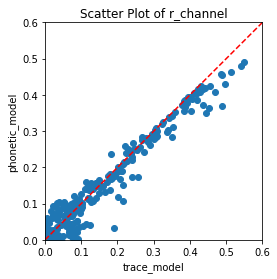

In [68]:
task_name = "overt"
model_x = "trace_model"
model_y = "phonetic_model"
fs = 10
ds_a = -30
ds_p = 30
delays = np.arange(ds_a, ds_p)


for HS in HS_list:
    print(HS)
    save_path = clean_data_path + "TRF/"+"HS"+str(HS)+"/"
    r_channel_x = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model_x+"_corr_channel.npy", allow_pickle=True).item()
    r_channel_y = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model_y+"_corr_channel.npy", allow_pickle=True).item()

    x = r_channel_x["all"]
    y = r_channel_y["all"]

    # 绘制散点图
    plt.scatter(x, y)

    # 设置x和y轴的范围相同，使其对称
    plt.gca().set_aspect('equal', adjustable='box')
    
    plt.plot([0, 0.6], [0, 0.6], color='red', linestyle='--')

    # 设置x和y轴的范围为0到0.6
    plt.xlim(0, 0.6)
    plt.ylim(0, 0.6)
    
    # 添加标题和轴标签
    plt.title('Scatter Plot of r_channel')
    plt.xlabel(model_x)
    plt.ylabel(model_y)

    # 显示图形
    plt.show()

44


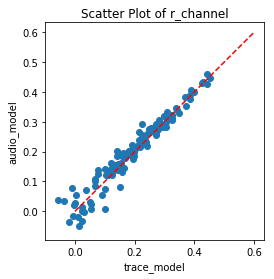

45


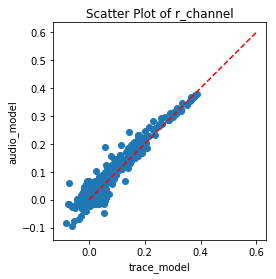

47


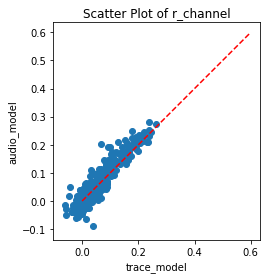

48


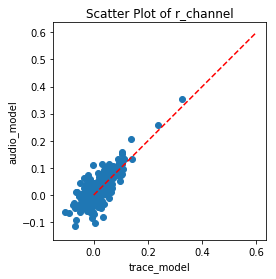

50


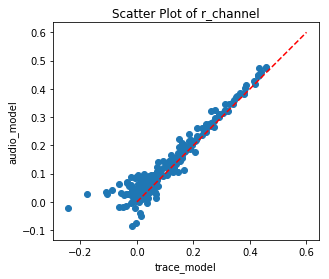

54


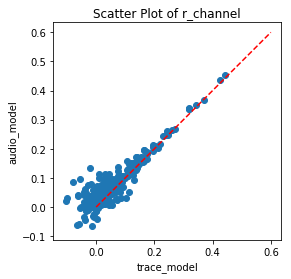

71


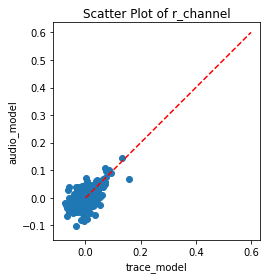

73


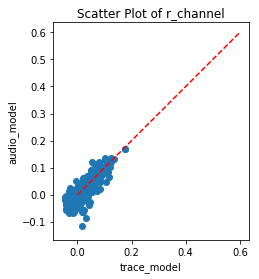

76


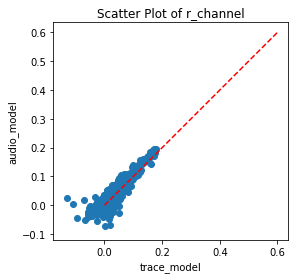

78


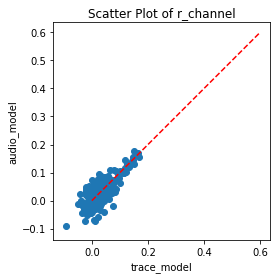

In [27]:
task_name = "covert"
model_x = "trace_model"
model_y = "audio_model"
fs = 10
ds_a = -30
ds_p = 30
delays = np.arange(ds_a, ds_p)


for HS in HS_list:
    print(HS)
    save_path = clean_data_path + "TRF/"+"HS"+str(HS)+"/"
    r_channel_x = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model_x+"_corr_channel.npy", allow_pickle=True).item()
    r_channel_y = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model_y+"_corr_channel.npy", allow_pickle=True).item()

    x = r_channel_x["all"]
    y = r_channel_y["all"]

    # 绘制散点图
    plt.scatter(x, y)

    # 设置x和y轴的范围相同，使其对称
    plt.gca().set_aspect('equal', adjustable='box')
    
    plt.plot([0, 0.6], [0, 0.6], color='red', linestyle='--')

#     # 设置x和y轴的范围为0到0.6
#     plt.xlim(0, 0.6)
#     plt.ylim(0, 0.6)
    
    # 添加标题和轴标签
    plt.title('Scatter Plot of r_channel')
    plt.xlabel(model_x)
    plt.ylabel(model_y)

    # 显示图形
    plt.show()

44


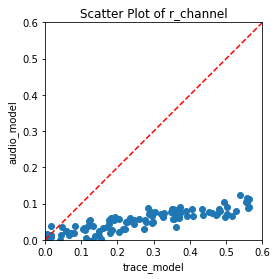

45


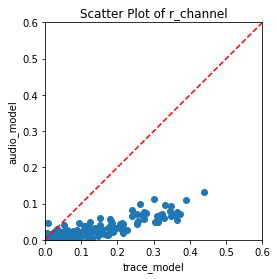

47


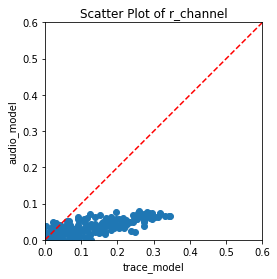

48


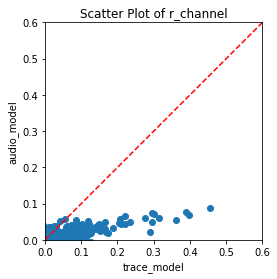

50


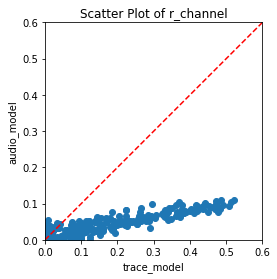

54


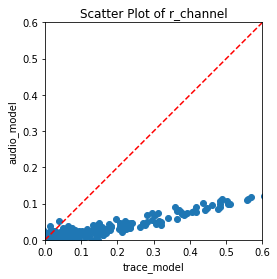

71


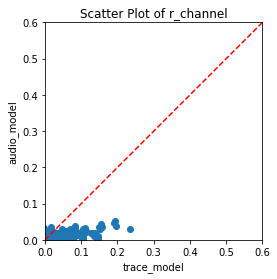

73


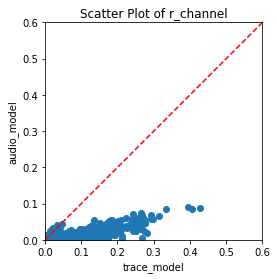

76


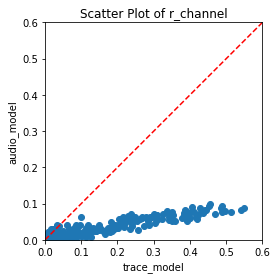

In [70]:
task_name = "overt"
model_x = "trace_model"
model_y = "audio_model"
fs = 10
ds_a = -30
ds_p = 30
delays = np.arange(ds_a, ds_p)


for HS in HS_list:
    print(HS)
    save_path = clean_data_path + "TRF/"+"HS"+str(HS)+"/"
    r_channel_x = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model_x+"_corr_channel.npy", allow_pickle=True).item()
    r_channel_y = np.load(save_path+"HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model_y+"_corr_channel.npy", allow_pickle=True).item()

    x = r_channel_x["all"]
    y = r_channel_y["all"]

    # 绘制散点图
    plt.scatter(x, y)

    # 设置x和y轴的范围相同，使其对称
    plt.gca().set_aspect('equal', adjustable='box')
    
    plt.plot([0, 0.6], [0, 0.6], color='red', linestyle='--')

    # 设置x和y轴的范围为0到0.6
    plt.xlim(0, 0.6)
    plt.ylim(0, 0.6)
    
    # 添加标题和轴标签
    plt.title('Scatter Plot of r_channel')
    plt.xlabel(model_x)
    plt.ylabel(model_y)

    # 显示图形
    plt.show()

In [45]:
clean_data_path

'/Users/zhaozehao/Desktop/reading task/'

In [57]:
from scipy.stats import pearsonr
def load_F(HS):
    if HS < 70:
        task_name_list = ['overt', 'covert']
    else:
        task_name_list = ['overt', 'covert','cue']
    F_values_save_path = os.path.join(clean_data_path, "F_values","HS" + str(HS) )
    save_sig_name = "HS"+str(HS)+"_F_sig.npy"
    save_name = "HS"+str(HS)+"_F_values.npy"
    F_values = np.load(os.path.join(F_values_save_path,save_name),allow_pickle=True).item()
    F_sig_elec_path = os.path.join(F_values_save_path,save_sig_name)
    F_sig_elecs = np.load(F_sig_elec_path,allow_pickle=True).item()
    for task_name in task_name_list:
        F_values[task_name] = F_values[task_name][:,0,:]
    return F_sig_elecs,F_values

In [165]:
color_set = {"syllable":"k","relPitch":(247/255,121/255,98/255),
             "lower_incisor":(148/255,148/255,148/255),
             "upper_lip":(227/255,67/255,95/255),
             "lower_lip":(243/255,216/255,109/255),
             "tongue_tip":(104/255,181/255,113/255),
             "tongue_body":(177/255,84/255,153/255),
             "tongue_dorsum":(177/255,84/255,153/255),
            'consonantal_place':'r', 
             'consonantal_manner':'b', 
             'vowel_place':'g'}

fs = 10
ds_a = -30
ds_p = 30
delays = np.arange(ds_a, ds_p)

def plot_uni_trace_brain(HS_list,model,task_name,nn_features):
    pwd = clean_data_path
    # 把figure放到for nn_feature里面就拆开各个nn_feature图片
    plt.figure(figsize=(10,10))
    for nn_feature in nn_features:
        
        path =os.path.join(pwd,"elecs")
        img = mpimg.imread(os.path.join(path ,"MNI.png"))
        plt.imshow(img)
        for HS in HS_list:
            path_warped = os.path.join(path,"warped")
            elec_path = os.path.join(path,"elec_sig/"+str(HS)+"sig_elecs.npy") 
        
            subject = 'HS'+str(HS)
#             print(nn_feature,subject)
            xy = scio.loadmat(os.path.join(path_warped,subject + "_warped_elec_pos2D.mat"))['elecmatrix']
    
            sig_elecs = np.load(elec_path,allow_pickle=True).item()
            
            n_chans = 256 if xy.shape[0] >= 256 else 128
#             F_sig_elecs,F_values = load_F(HS)
            
            save_path = os.path.join(clean_data_path, "TRF","HS"+str(HS))
        
        
            r2_channel = np.load(os.path.join(save_path,"HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model+"_r2_channel.npy"),allow_pickle=True).item()
            #设置上限，0.005以后的颜色相同
#             noise_ceiling = 0.01 if task_name=="overt" else 0.005
            noise_ceiling = 0.0001
            
                
            for elec in range(n_chans):
                #设置显示阈值下限 0.003
                r2_value = r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec]
                if r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec]>0.003:
                    if elec in sig_elecs[task_name]:
                        plt.scatter(xy[elec,0],xy[elec,1],marker = 'o',alpha =0.7,
                                s = r2_value/noise_ceiling,color=color_set[nn_feature])
                        plt.scatter(20,20,marker = 'o',alpha =0.7,s = 0.03/noise_ceiling,color='k')
                        plt.scatter(20,40,marker = 'o',alpha =0.7,s = 0.02/noise_ceiling,color='k')
                        plt.scatter(20,60,marker = 'o',alpha =0.7,s = 0.01/noise_ceiling,color='k')
                        plt.scatter(20,80,marker = 'o',alpha =0.7,s = 0.005/noise_ceiling,color='k')
#                         plt.scatter(7,50,marker = 'o',alpha =0.7,s = 0.01/noise_ceiling,color='k')
#                     else:
#                         plt.plot(xy[elec,0],xy[elec,1],marker = 'o',alpha =min ((r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec])/noise_ceiling,1),color=color_set[nn_feature])
            

#                     if elec in F_sig_elecs[task_name]:
#                         plt.plot(xy[elec,0],xy[elec,1],marker = 'o',alpha = min ((r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec])/noise_ceiling,1),color=color_set[nn_feature])
#                     elif elec in sig_elecs[task_name]:
#                         plt.plot(xy[elec,0],xy[elec,1],marker = 's',alpha =min ((r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec])/noise_ceiling,1),color=color_set[nn_feature])
#                     else:
#                         plt.plot(xy[elec,0],xy[elec,1],marker = '*',alpha =min ((r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec])/noise_ceiling,1),color=color_set[nn_feature])
                
        
#             plt.title(nn_feature+": "+task_name)
            plt.box(on=None)
            plt.grid("off")
            plt.yticks([])
            plt.xticks([])
            
def plot_all_feature_brain(HS_list,model,task_name):
    pwd = clean_data_path
    # 把figure放到for nn_feature里面就拆开各个nn_feature图片
    plt.figure(figsize=(10,10))    
    path =os.path.join(pwd,"elecs")
    img = mpimg.imread(os.path.join(path ,"MNI.png"))
    plt.imshow(img)
    for HS in HS_list:
        path_warped = os.path.join(path,"warped")
        elec_path = os.path.join(path,"elec_sig/"+str(HS)+"sig_elecs.npy") 

        subject = 'HS'+str(HS)
#             print(nn_feature,subject)
        xy = scio.loadmat(os.path.join(path_warped,subject + "_warped_elec_pos2D.mat"))['elecmatrix']

        sig_elecs = np.load(elec_path,allow_pickle=True).item()

        n_chans = 256 if xy.shape[0] >= 256 else 128
#             F_sig_elecs,F_values = load_F(HS)

        save_path = os.path.join(clean_data_path, "TRF","HS"+str(HS))


        r2_channel = np.load(os.path.join(save_path,"HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model+"_r2_channel.npy"),allow_pickle=True).item()
        #设置上限，0.005以后的颜色相同
#         noise_ceiling = 0.01 if task_name=="overt" else 0.005
        noise_ceiling = 0.004



        for elec in range(n_chans):
            #设置显示阈值下限 0.003
            r2_value = r2_channel["all"][elec]
            if r2_channel["all"][elec]>0.01:
                if elec in sig_elecs[task_name]:
                    plt.scatter(xy[elec,0],xy[elec,1],marker = 'o',alpha =0.7,
                                s = r2_value/noise_ceiling,color=color_task_list[task_name])
                    plt.scatter(20,20,marker = 'o',alpha =0.7,s = 0.5/noise_ceiling,color='k')
                    plt.scatter(20,40,marker = 'o',alpha =0.7,s = 0.3/noise_ceiling,color='k')
                    plt.scatter(20,60,marker = 'o',alpha =0.7,s = 0.1/noise_ceiling,color='k')
                    plt.scatter(20,80,marker = 'o',alpha =0.7,s = 0.05/noise_ceiling,color='k')
                    plt.scatter(20,100,marker = 'o',alpha =0.7,s = 0.01/noise_ceiling,color='k')
#                     else:
#                         plt.plot(xy[elec,0],xy[elec,1],marker = 'o',alpha =min ((r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec])/noise_ceiling,1),color=color_set[nn_feature])


#                     if elec in F_sig_elecs[task_name]:
#                         plt.plot(xy[elec,0],xy[elec,1],marker = 'o',alpha = min ((r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec])/noise_ceiling,1),color=color_set[nn_feature])
#                     elif elec in sig_elecs[task_name]:
#                         plt.plot(xy[elec,0],xy[elec,1],marker = 's',alpha =min ((r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec])/noise_ceiling,1),color=color_set[nn_feature])
#                     else:
#                         plt.plot(xy[elec,0],xy[elec,1],marker = '*',alpha =min ((r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec])/noise_ceiling,1),color=color_set[nn_feature])


#             plt.title(nn_feature+": "+task_name)
        plt.box(on=None)
        plt.grid("off")
        plt.yticks([])
        plt.xticks([])


In [147]:
def plot_uni_trace_orig_brain(HS_list,model,task_name,nn_features):
    pwd = clean_data_path
    # 把figure放到for nn_feature里面就拆开各个nn_feature图片        
    for HS in HS_list:
        plt.figure(figsize=(10,10))
        path =os.path.join(pwd,"elecs")
        path_warped = os.path.join(path,"warped")
        brain_path = os.path.join(path,"brain2D")
        
        img = mpimg.imread(os.path.join(brain_path,"HS"+str(HS)+"_brain2D.png"))
        plt.imshow(img)
        
        elec_path = os.path.join(path,"elec_sig/"+str(HS)+"sig_elecs.npy") 

        subject = 'HS'+str(HS)

        xy = scio.loadmat(os.path.join(brain_path,subject+"_elec_pos2D.mat"))['elecmatrix']

        sig_elecs = np.load(elec_path,allow_pickle=True).item()

        n_chans = 256 if xy.shape[0] >= 256 else 128

        save_path = os.path.join(clean_data_path, "TRF","HS"+str(HS))
        r2_channel = np.load(os.path.join(save_path,"HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model+"_r2_channel.npy"),allow_pickle=True).item()
        
        noise_ceiling = 0.0001
        for nn_feature in nn_features:
            for elec in range(n_chans):
                #设置显示阈值下限 0.003
                r2_value = r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec]
                if r2_channel["all"][elec] -  r2_channel["ex_"+nn_feature][elec]>0.003:
                    if elec in sig_elecs[task_name]:
                        plt.scatter(xy[elec,0],xy[elec,1],marker = 'o',alpha =1,
                                s = r2_value/noise_ceiling,color=color_set[nn_feature])
#                         plt.text(xy[elec,0],xy[elec,1],str(elec), fontsize=10, ha='left', va='bottom')
                        
                        plt.scatter(20,20,marker = 'o',alpha =0.7,s = 0.03/noise_ceiling,color='k')
                        plt.scatter(20,40,marker = 'o',alpha =0.7,s = 0.02/noise_ceiling,color='k')
                        plt.scatter(20,60,marker = 'o',alpha =0.7,s = 0.01/noise_ceiling,color='k')
                        plt.scatter(20,80,marker = 'o',alpha =0.7,s = 0.005/noise_ceiling,color='k')
            plt.box(on=None)
            plt.title(str(HS)+"---"+task_name)
            plt.grid("off")
            plt.yticks([])
            plt.xticks([])
            


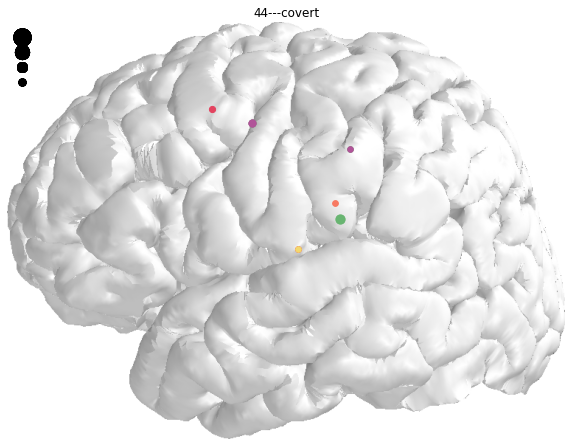

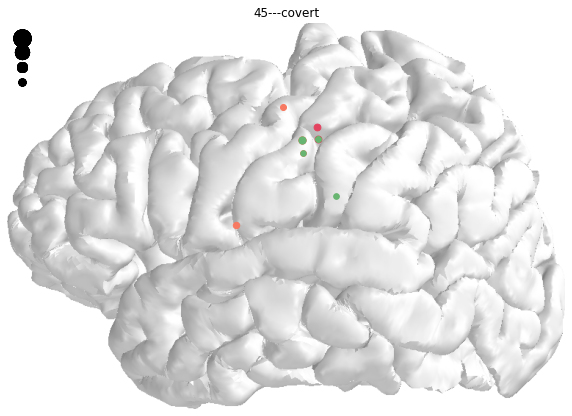

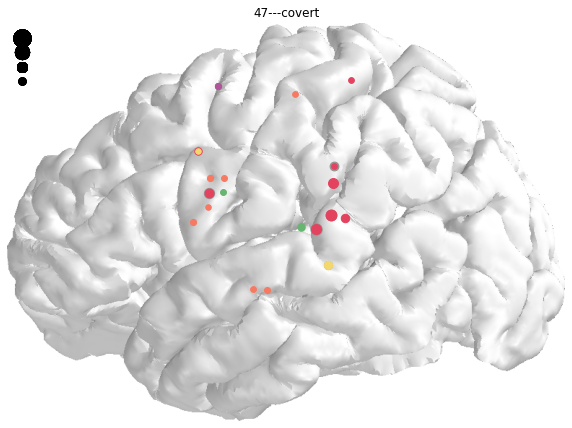

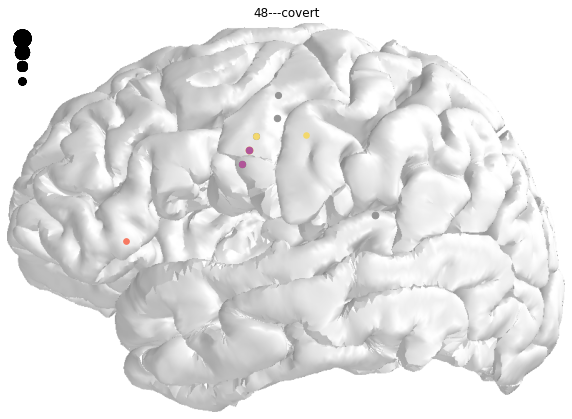

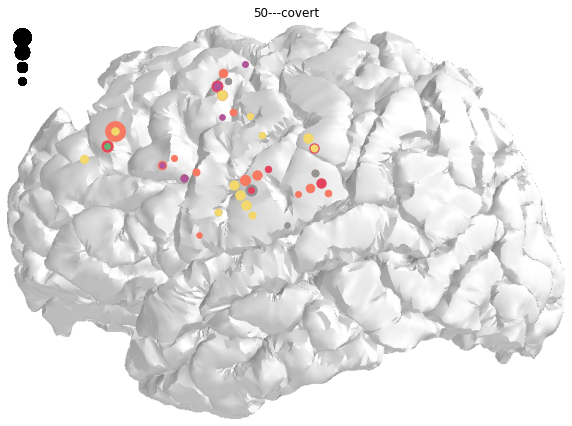

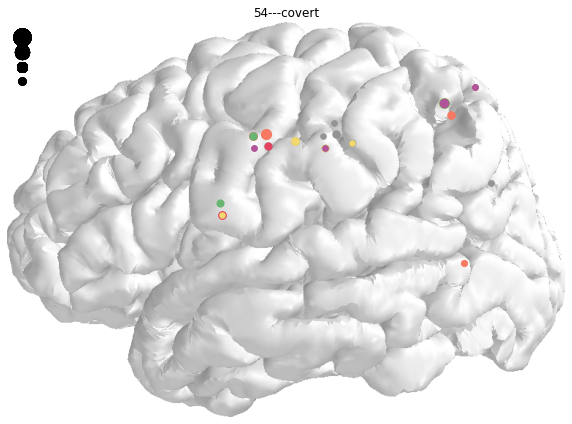

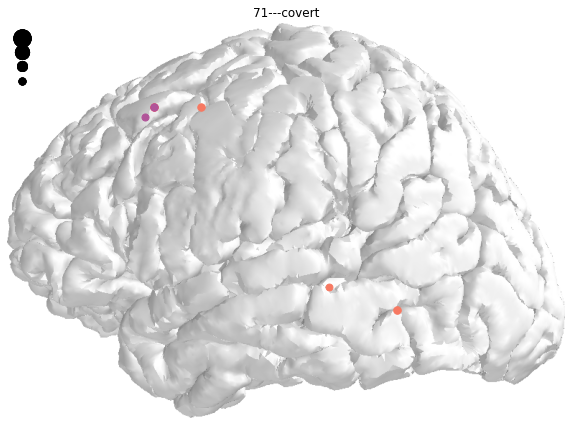

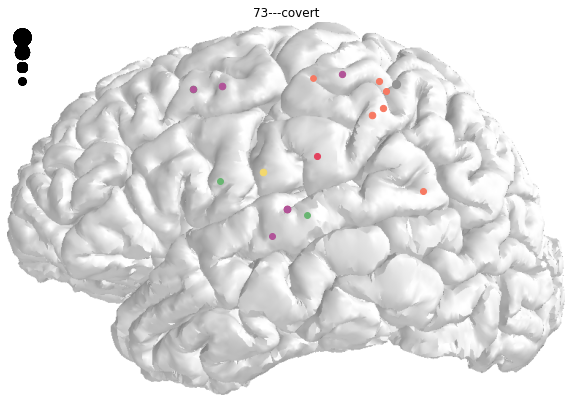

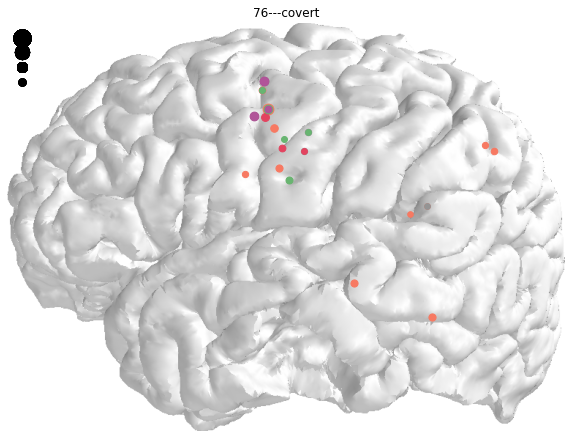

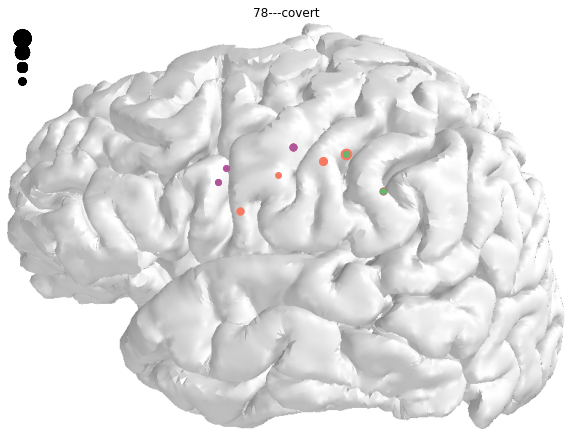

In [148]:
task_name_list = ["covert"]
for task_name in task_name_list:
    plot_uni_trace_orig_brain(HS_list,"trace_model",task_name,ex_features["trace_model"])

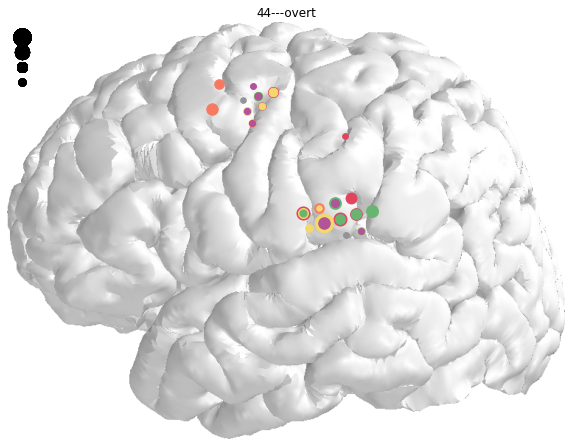

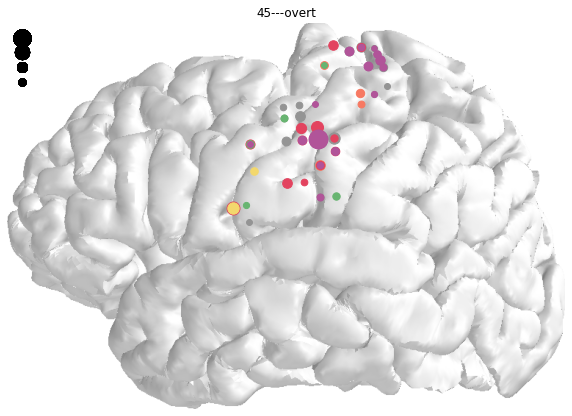

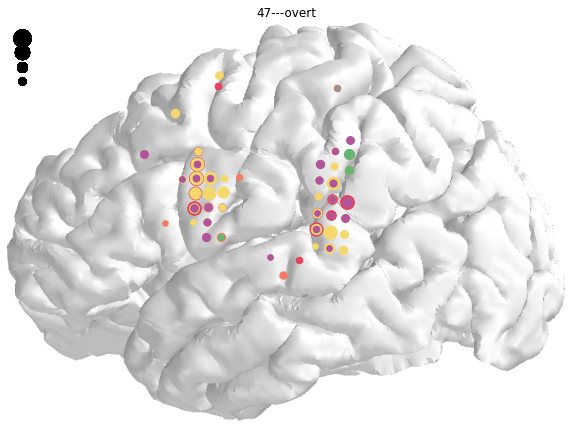

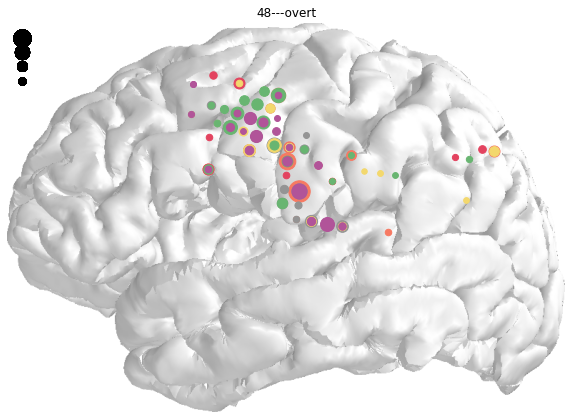

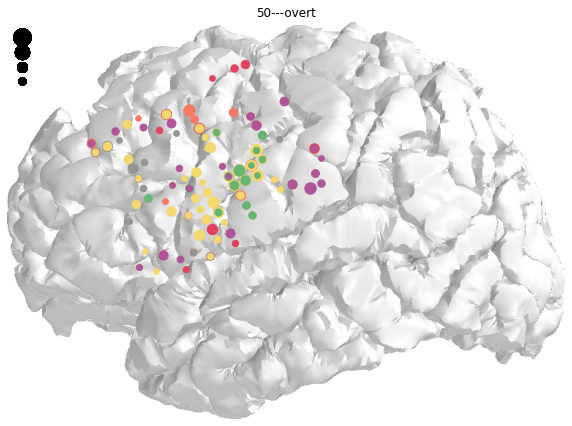

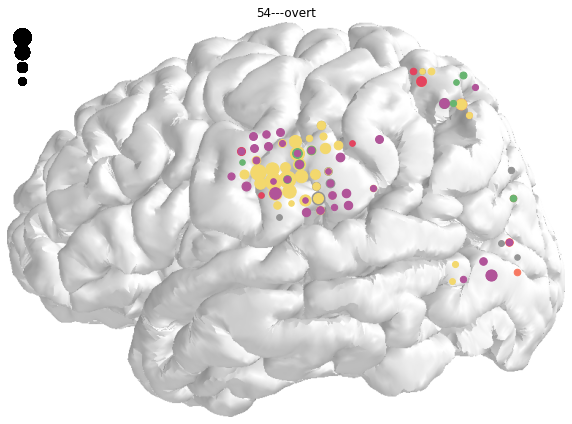

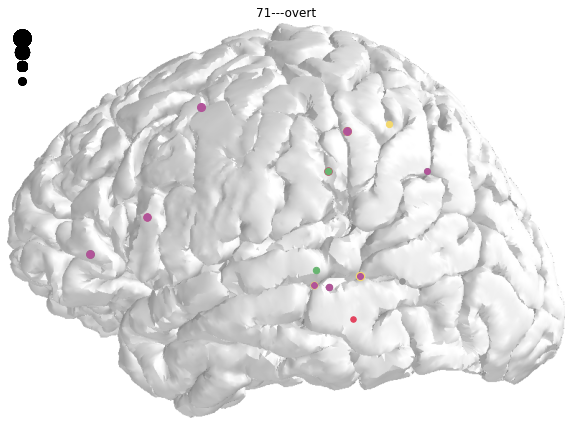

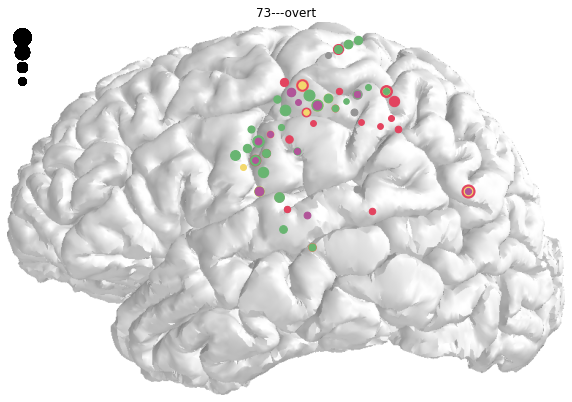

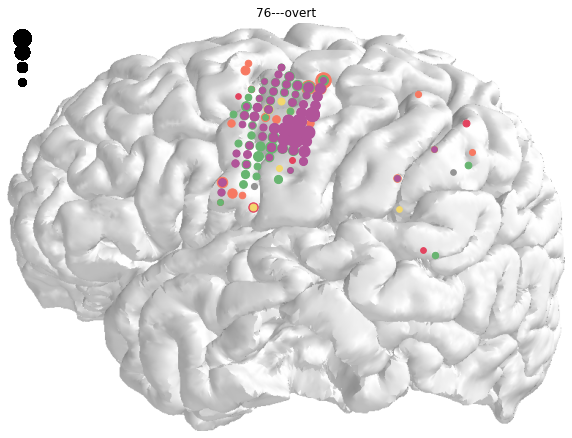

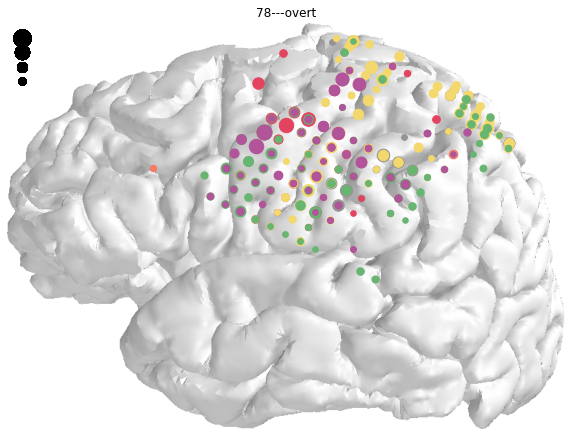

In [149]:
task_name_list = ["overt"]
for task_name in task_name_list:
    plot_uni_trace_orig_brain(HS_list,"trace_model",task_name,ex_features["trace_model"])

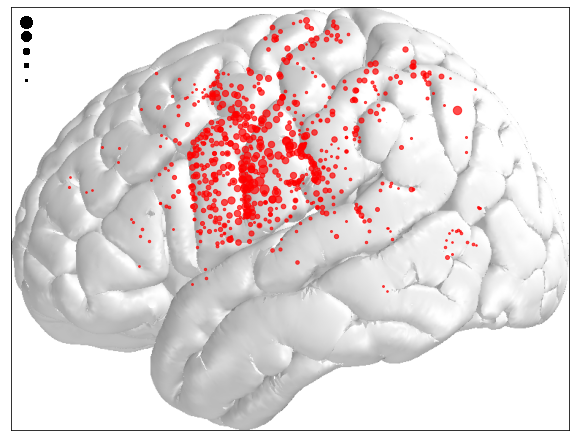

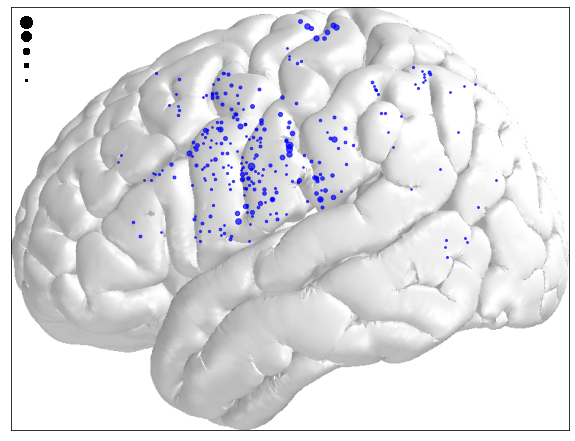

In [166]:
task_name_list = ['overt',"covert"]
color_task_list = {'overt':'r',
                   "covert":'b'}

model = 'phonetic_model_2'
for task_name in task_name_list:
    plot_all_feature_brain(HS_list,model,task_name)

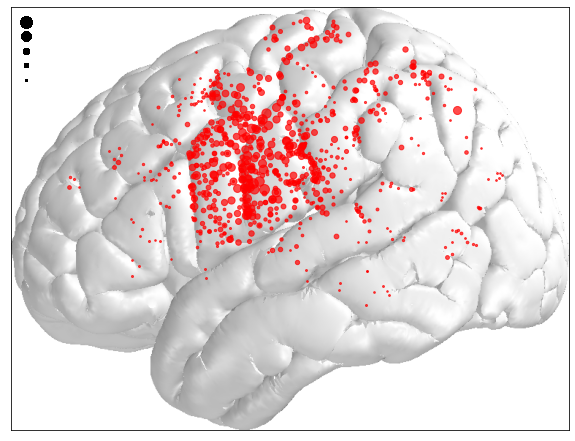

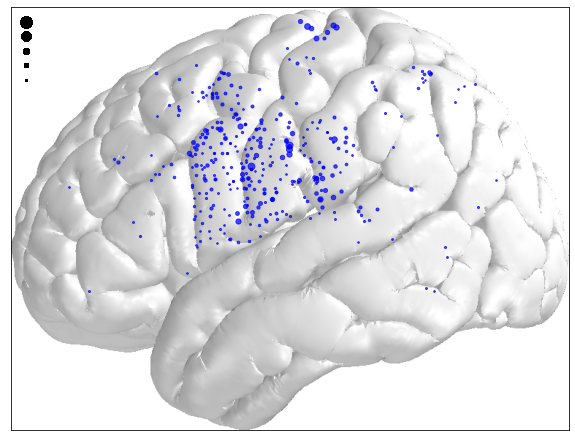

In [167]:
task_name_list = ['overt',"covert"]
color_task_list = {'overt':'r',
                   "covert":'b'}

model = 'trace_model'
for task_name in task_name_list:
    plot_all_feature_brain(HS_list,model,task_name)

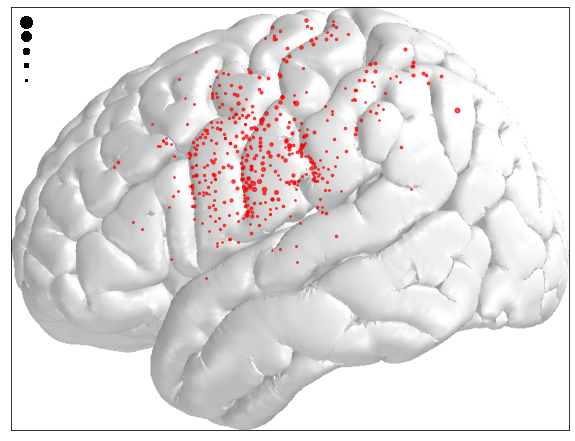

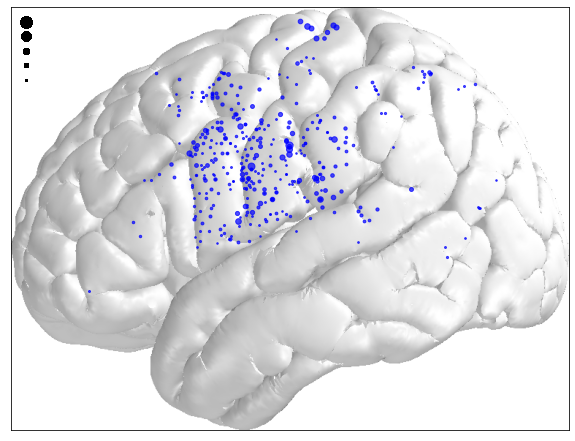

In [168]:
task_name_list = ['overt',"covert"]
color_task_list = {'overt':'r',
                   "covert":'b'}

model = 'audio_model'
for task_name in task_name_list:
    plot_all_feature_brain(HS_list,model,task_name)

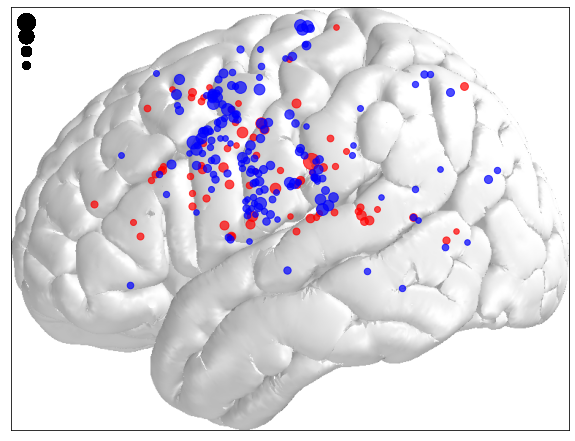

In [102]:
task_name_list = ["covert"]
model = 'phonetic_model_2'
for task_name in task_name_list:
    plot_uni_trace_brain(HS_list,model,task_name,ex_features[model][0:2])

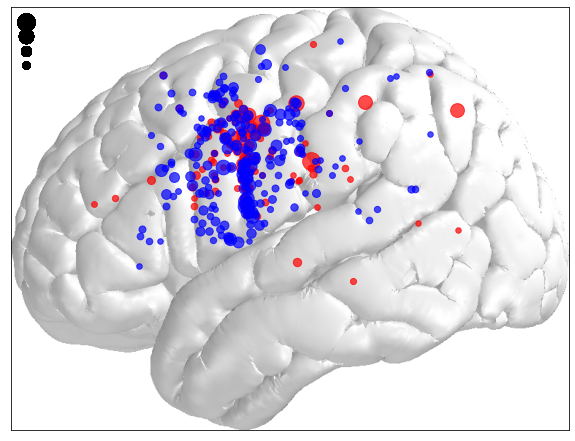

In [103]:
task_name_list = ["overt"]
model = 'phonetic_model_2'
for task_name in task_name_list:
    plot_uni_trace_brain(HS_list,model,task_name,ex_features[model][0:2])

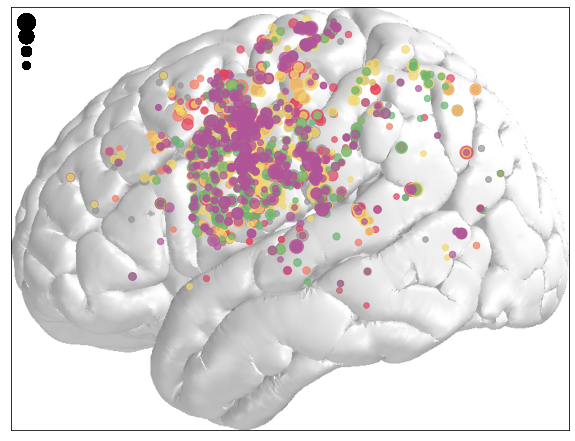

In [112]:
task_name_list = ["overt"]
model = 'trace_model'
for task_name in task_name_list:
    plot_uni_trace_brain(HS_list,model,task_name,ex_features[model])

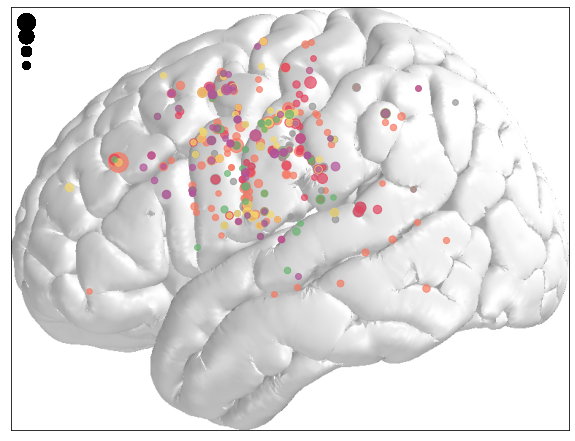

In [113]:
task_name_list = ["covert"]
model = 'trace_model'
for task_name in task_name_list:
    plot_uni_trace_brain(HS_list,model,task_name,ex_features[model])

HS44
HS45
HS47
HS48
HS50
HS54
HS71
HS73
HS76
HS78


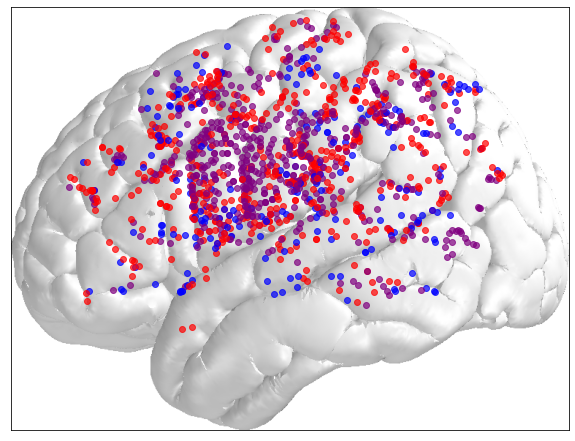

In [170]:
pwd = clean_data_path
# 把figure放到for nn_feature里面就拆开各个nn_feature图片
plt.figure(figsize=(10,10))
path =os.path.join(pwd,"elecs")
img = mpimg.imread(os.path.join(path ,"MNI.png"))
plt.imshow(img)

for HS in HS_list:
    path_warped = os.path.join(path,"warped")
    elec_path = os.path.join(path,"elec_sig/"+str(HS)+"sig_elecs.npy") 

    subject = 'HS'+str(HS)
    print(subject)
    xy = scio.loadmat(os.path.join(path_warped,subject + "_warped_elec_pos2D.mat"))['elecmatrix']

    sig_elecs = np.load(elec_path,allow_pickle=True).item()

    n_chans = 256 if xy.shape[0] >= 256 else 128
#             F_sig_elecs,F_values = load_F(HS)

    save_path = os.path.join(clean_data_path, "TRF","HS"+str(HS))

    for elec in range(n_chans):
        if elec in sig_elecs['overt'] and elec not in sig_elecs['covert']:
            plt.scatter(xy[elec,0],xy[elec,1],marker = 'o',alpha =0.7,color='r')
        if elec in sig_elecs['covert'] and elec not in sig_elecs['overt']:
            plt.scatter(xy[elec,0],xy[elec,1],marker = 'o',alpha =0.7,color='b')
        if elec in sig_elecs['overt'] and elec in sig_elecs['covert']:
            plt.scatter(xy[elec,0],xy[elec,1],marker = 'o',alpha =0.7,color='purple')

    plt.box(on=None)
    plt.grid("off")
    plt.yticks([])
    plt.xticks([])

HS44
HS45
HS47
HS48
HS50
HS54
HS71
HS73
HS76
HS78


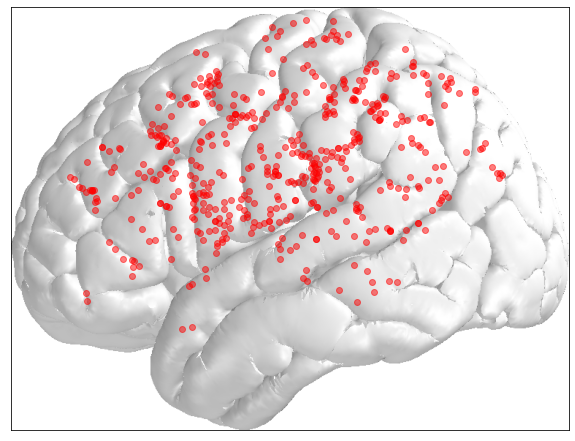

In [153]:
pwd = clean_data_path
# 把figure放到for nn_feature里面就拆开各个nn_feature图片
plt.figure(figsize=(10,10))
path =os.path.join(pwd,"elecs")
img = mpimg.imread(os.path.join(path ,"MNI.png"))
plt.imshow(img)

for HS in HS_list:
    path_warped = os.path.join(path,"warped")
    elec_path = os.path.join(path,"elec_sig/"+str(HS)+"sig_elecs.npy") 

    subject = 'HS'+str(HS)
    print(subject)
    xy = scio.loadmat(os.path.join(path_warped,subject + "_warped_elec_pos2D.mat"))['elecmatrix']

    sig_elecs = np.load(elec_path,allow_pickle=True).item()

    n_chans = 256 if xy.shape[0] >= 256 else 128
#             F_sig_elecs,F_values = load_F(HS)

    save_path = os.path.join(clean_data_path, "TRF","HS"+str(HS))

    for elec in range(n_chans):
        if elec in sig_elecs['overt'] and elec not in sig_elecs['covert']:
            plt.scatter(xy[elec,0],xy[elec,1],marker = 'o',alpha =0.5,color='r')


    plt.box(on=None)
    plt.grid("off")
    plt.yticks([])
    plt.xticks([])

HS44
HS45
HS47
HS48
HS50
HS54
HS71
HS73
HS76
HS78


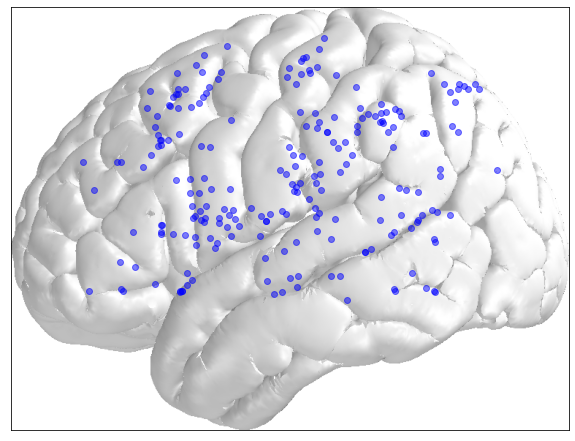

In [154]:
pwd = clean_data_path
# 把figure放到for nn_feature里面就拆开各个nn_feature图片
plt.figure(figsize=(10,10))
path =os.path.join(pwd,"elecs")
img = mpimg.imread(os.path.join(path ,"MNI.png"))
plt.imshow(img)

for HS in HS_list:
    path_warped = os.path.join(path,"warped")
    elec_path = os.path.join(path,"elec_sig/"+str(HS)+"sig_elecs.npy") 

    subject = 'HS'+str(HS)
    print(subject)
    xy = scio.loadmat(os.path.join(path_warped,subject + "_warped_elec_pos2D.mat"))['elecmatrix']

    sig_elecs = np.load(elec_path,allow_pickle=True).item()

    n_chans = 256 if xy.shape[0] >= 256 else 128
#             F_sig_elecs,F_values = load_F(HS)

    save_path = os.path.join(clean_data_path, "TRF","HS"+str(HS))

    for elec in range(n_chans):
        if elec in sig_elecs['covert'] and elec not in sig_elecs['overt']:
            plt.scatter(xy[elec,0],xy[elec,1],marker = 'o',alpha =0.5,color='b')


    plt.box(on=None)
    plt.grid("off")
    plt.yticks([])
    plt.xticks([])

HS44
HS45
HS47
HS48
HS50
HS54
HS71
HS73
HS76
HS78


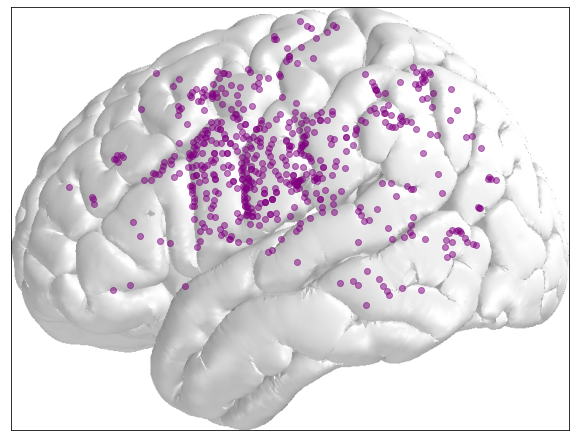

In [155]:
pwd = clean_data_path
# 把figure放到for nn_feature里面就拆开各个nn_feature图片
plt.figure(figsize=(10,10))
path =os.path.join(pwd,"elecs")
img = mpimg.imread(os.path.join(path ,"MNI.png"))
plt.imshow(img)

for HS in HS_list:
    path_warped = os.path.join(path,"warped")
    elec_path = os.path.join(path,"elec_sig/"+str(HS)+"sig_elecs.npy") 

    subject = 'HS'+str(HS)
    print(subject)
    xy = scio.loadmat(os.path.join(path_warped,subject + "_warped_elec_pos2D.mat"))['elecmatrix']

    sig_elecs = np.load(elec_path,allow_pickle=True).item()

    n_chans = 256 if xy.shape[0] >= 256 else 128
#             F_sig_elecs,F_values = load_F(HS)

    save_path = os.path.join(clean_data_path, "TRF","HS"+str(HS))

    for elec in range(n_chans):
        if elec in sig_elecs['covert'] and elec in sig_elecs['overt']:
            plt.scatter(xy[elec,0],xy[elec,1],marker = 'o',alpha =0.5,color='purple')


    plt.box(on=None)
    plt.grid("off")
    plt.yticks([])
    plt.xticks([])

([], <a list of 0 Text xticklabel objects>)

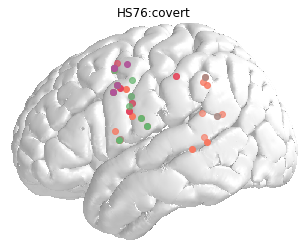

In [90]:
HS_list = [76]
task_list = ["covert"]
model_list = ["trace_model"]

HS = HS_list[0]
task_name = task_list[0]
model = model_list[0]

pwd = clean_data_path
# 把figure放到for nn_feature里面就拆开各个nn_feature图片
# plt.figure(figsize=(15,15))

subject = 'HS'+str(HS)
path =os.path.join(pwd,"elecs")
img = mpimg.imread(os.path.join(path ,"MNI.png"))
plt.imshow(img)

save_path = os.path.join(clean_data_path, "TRF","HS"+str(HS))
r2_channel = np.load(save_path+"/HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model+"_r2_channel.npy", allow_pickle=True).item()
del_r2_channel = {}
for i in ex_features[model]:
    del_r2_channel[i] = r2_channel["all"]-r2_channel["ex_"+i]

path_warped = os.path.join(path,"warped")
elec_path = os.path.join(path,"elec_sig/"+str(HS)+"sig_elecs.npy") 

xy = scio.loadmat(os.path.join(path_warped,subject + "_warped_elec_pos2D.mat"))['elecmatrix']
sig_elecs = np.load(elec_path,allow_pickle=True).item()

n_chans = 256 if xy.shape[0] >= 256 else 128
# F_sig_elecs,F_values = load_F(HS)

#设置上限，0.005以后的颜色相同
noise_ceiling = 0.01 if task_name=="overt" else 0.005

for i in ex_features[model]:
    for elec in range(n_chans):
        #设置显示阈值下限 0.005
        if del_r2_channel[i][elec]>0.003:
            plt.plot(xy[elec,0],xy[elec,1],marker = 'o',alpha = min ((del_r2_channel[i][elec])/noise_ceiling,1),color=color_set[i])

plt.title("HS"+str(HS)+":"+task_name)
plt.box(on=None)
plt.grid("off")
plt.yticks([])
plt.xticks([])


([], <a list of 0 Text xticklabel objects>)

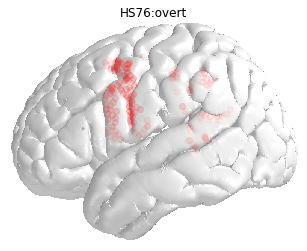

In [111]:
HS_list = [76]
task_list = ["overt"]
model_list = ["audio_model"]

HS = HS_list[0]
task_name = task_list[0]
model = model_list[0]

pwd = clean_data_path
# 把figure放到for nn_feature里面就拆开各个nn_feature图片
# plt.figure(figsize=(15,15))

subject = 'HS'+str(HS)
path =os.path.join(pwd,"elecs")
img = mpimg.imread(os.path.join(path ,"MNI.png"))
plt.imshow(img)

save_path = os.path.join(clean_data_path, "TRF","HS"+str(HS))
r_channel = np.load(save_path+"/HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model+"_corr_channel.npy", allow_pickle=True).item()

path_warped = os.path.join(path,"warped")
elec_path = os.path.join(path,"elec_sig/"+str(HS)+"sig_elecs.npy") 

xy = scio.loadmat(os.path.join(path_warped,subject + "_warped_elec_pos2D.mat"))['elecmatrix']
sig_elecs = np.load(elec_path,allow_pickle=True).item()

n_chans = 256 if xy.shape[0] >= 256 else 128
# F_sig_elecs,F_values = load_F(HS)

for elec in range(n_chans):
    if r_channel["all"][elec] > 0.0:
        plt.plot(xy[elec,0],xy[elec,1],marker = 'o',alpha = r_channel["all"][elec]/0.5, color = "red")

plt.title("HS"+str(HS)+":"+task_name)
plt.box(on=None)
plt.grid("off")
plt.yticks([])
plt.xticks([])


([], <a list of 0 Text xticklabel objects>)

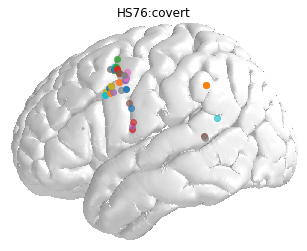

In [113]:
HS_list = [76]
task_list = ["covert"]
model_list = ["audio_model"]

HS = HS_list[0]
task_name = task_list[0]
model = model_list[0]

pwd = clean_data_path
# 把figure放到for nn_feature里面就拆开各个nn_feature图片
# plt.figure(figsize=(15,15))

subject = 'HS'+str(HS)
path =os.path.join(pwd,"elecs")
img = mpimg.imread(os.path.join(path ,"MNI.png"))
plt.imshow(img)

save_path = os.path.join(clean_data_path, "TRF","HS"+str(HS))
r2_channel = np.load(save_path+"/HS"+str(HS)+"_"+task_name+"_"+str(int(ds_a*fs))+str(int(ds_p*fs))+"_"+model+"_r2_channel.npy", allow_pickle=True).item()
del_r2_channel = {}
for i in ex_features[model]:
    del_r2_channel[i] = r2_channel["all"]-r2_channel["ex_"+i]

path_warped = os.path.join(path,"warped")
elec_path = os.path.join(path,"elec_sig/"+str(HS)+"sig_elecs.npy") 

xy = scio.loadmat(os.path.join(path_warped,subject + "_warped_elec_pos2D.mat"))['elecmatrix']
sig_elecs = np.load(elec_path,allow_pickle=True).item()

n_chans = 256 if xy.shape[0] >= 256 else 128
# F_sig_elecs,F_values = load_F(HS)

#设置上限，0.005以后的颜色相同
noise_ceiling = 0.01 if task_name=="overt" else 0.005

for i in ex_features[model]:
    for elec in range(n_chans):
        #设置显示阈值下限 0.005
        if del_r2_channel[i][elec]>0.003:
            plt.plot(xy[elec,0],xy[elec,1],marker = 'o',alpha = min ((del_r2_channel[i][elec])/noise_ceiling,1))

plt.title("HS"+str(HS)+":"+task_name)
plt.box(on=None)
plt.grid("off")
plt.yticks([])
plt.xticks([])


In [114]:
ex_features["audio_model"]

['syllable', 'intensity', 'absPitch', 'f1', 'f2', 'peakRate']